In [1]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

Using TensorFlow backend.


['/job:localhost/replica:0/task:0/device:GPU:0']

In [1]:
from pymongo import MongoClient
from bson.objectid import ObjectId

import time,datetime
import os

import pandas as pd
import pandas_datareader.data as web
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import style

from keras.models import Model, Sequential
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D

from sklearn import preprocessing

from copy import deepcopy
from IPython.display import clear_output

Using TensorFlow backend.


In [2]:
style.use('ggplot')

In [5]:
conn = MongoClient('120.126.136.17')
db = conn.Tracker
collection = [db.james]# db.db2, db.dn2, db.james, db.leo
clean_data = []
for col in collection:
    cursor = col.find({})
    df = pd.DataFrame(list(cursor))

In [6]:
df.replace('', np.nan, inplace=True)

In [7]:
df.fillna(method='ffill', inplace=True)
df.isnull().sum().sum()

0

In [ ]:
df['hr_value'] = df['hr_value'].astype(float)
df['o2_value'] = df['o2_value'].astype(float)
df['latitude'] = df['latitude'].astype(float)
df['longitude'] = df['longitude'].astype(float)
df['step_value'] = df['step_value'].astype(float)

In [129]:
df['moving_distance'] = np.abs(df.latitude.diff() * 111000) + np.abs(df.longitude.diff() * 110987)

In [132]:
df.head()

,_id,day,hour,hr_value,latitude,longitude,minute,month,o2_value,second,step_value,timestamp,year,moving_distance
0,5c9b3935c4e5a668b7e9be2c,27,16,84.0,24.945194,121.372277,49,3,95.0,47,0,1.553677e+09,2019,NaN
1,5c9b393fc4e5a668b7e9be2e,27,16,84.0,24.945194,121.372277,49,3,95.0,57,0,1.553677e+09,2019,0.0
2,5c9b3949c4e5a668b7e9be30,27,16,84.0,24.945194,121.372277,50,3,95.0,7,0,1.553677e+09,2019,0.0
3,5c9b3953c4e5a668b7e9be32,27,16,84.0,24.945194,121.372277,50,3,95.0,17,0,1.553677e+09,2019,0.0
4,5c9b395dc4e5a668b7e9be34,27,16,79.0,24.945194,121.372277,50,3,98.0,27,0,1.553677e+09,2019,0.0


In [115]:
dftspdiff = df['timestamp'].diff()
dftfdiffSTD = dftspdiff.rolling(20).std()

# find the place that std is smaller than 5
lis = []
changeFlag = 0
tempt = [0]
for i in range(len(dftfdiffSTD)):
    if dftfdiffSTD[i] < 5 and changeFlag == True and len(tempt) < 2:
        tempt.append(i)
        changeFlag = False
    if dftfdiffSTD[i] >= 5 and changeFlag == False and len(tempt) < 2:
        tempt.append(i-1)
        changeFlag = True
    if len(tempt) == 2:
        lis.append(tempt)
        tempt = []
print(lis)

[[0, 108], [212, 238], [259, 371], [407, 511], [532, 650], [672, 782], [805, 830], [1072, 1176], [1197, 1485], [1506, 1757], [1845, 1867], [1888, 2240], [2261, 2263], [2313, 2381], [2466, 2859], [2994, 3101], [3129, 3864], [3980, 4169], [4275, 4373], [4448, 4797], [4818, 4986], [5018, 5024], [5115, 5533], [5554, 5886], [5912, 5926], [6046, 6065], [6087, 6151], [6265, 6295], [6360, 6420], [6554, 6582], [6619, 6624], [6683, 6748], [6769, 6820], [6886, 6948], [6970, 7108], [7129, 7137], [7169, 7193], [7373, 7507], [7554, 7671], [7714, 7738], [7761, 7852], [7874, 7905], [7979, 8428], [8576, 8598], [8680, 8735], [8758, 8905], [8929, 8968], [9013, 9135], [9163, 9207], [9309, 9349], [9386, 9454], [9513, 9747], [9782, 10038], [10059, 10346], [10504, 10518], [10523, 10532], [10539, 10541], [10577, 10656], [10711, 10808], [10856, 10966], [11005, 11276], [11297, 11371], [11418, 11426], [11459, 11700], [11763, 11778], [11799, 14477], [14498, 14706], [14738, 15224], [15245, 15379], [15443, 15465], 

In [76]:
data_with_gap = []
for i in lis:
    data_with_gap.append(df[i[0]:i[1]])

In [77]:
data_with_gap[0].head()

,_id,day,hour,hr_value,latitude,longitude,minute,month,o2_value,second,step_value,timestamp,year
0,5c9b3935c4e5a668b7e9be2c,27,16,84.0,24.94519427,121.37227724,49,3,95.0,47,0,1.553677e+09,2019
1,5c9b393fc4e5a668b7e9be2e,27,16,84.0,24.94519427,121.37227724,49,3,95.0,57,0,1.553677e+09,2019
2,5c9b3949c4e5a668b7e9be30,27,16,84.0,24.94519427,121.37227724,50,3,95.0,7,0,1.553677e+09,2019
3,5c9b3953c4e5a668b7e9be32,27,16,84.0,24.94519427,121.37227724,50,3,95.0,17,0,1.553677e+09,2019
4,5c9b395dc4e5a668b7e9be34,27,16,79.0,24.94519427,121.37227724,50,3,98.0,27,0,1.553677e+09,2019


9


<IPython.core.display.Javascript object>


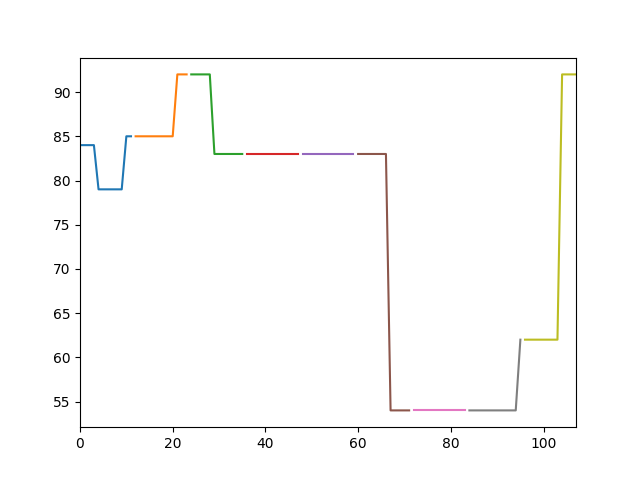

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
2


<IPython.core.display.Javascript object>


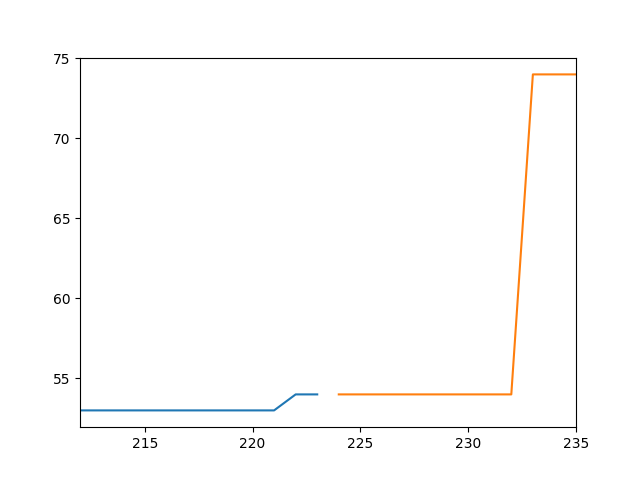

0 12
12 24
9


<IPython.core.display.Javascript object>


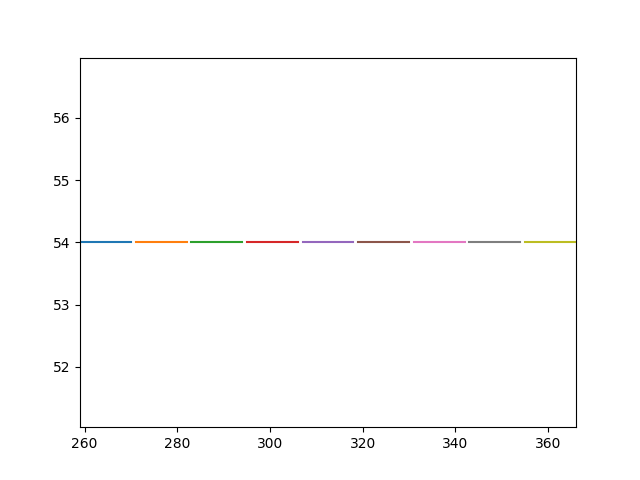

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
8


<IPython.core.display.Javascript object>


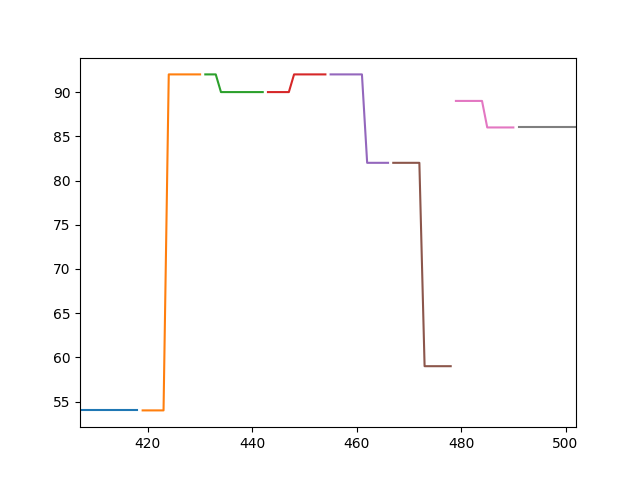

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
9


<IPython.core.display.Javascript object>


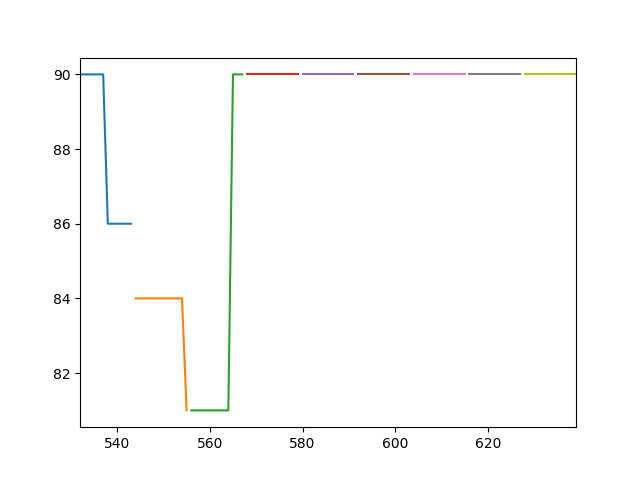

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
9


<IPython.core.display.Javascript object>


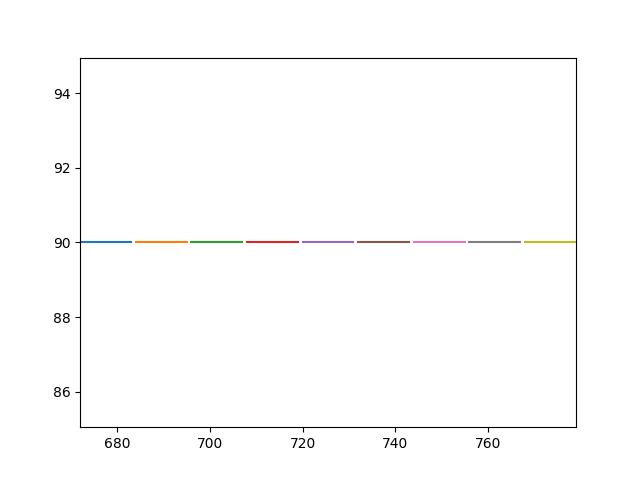

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
2


<IPython.core.display.Javascript object>


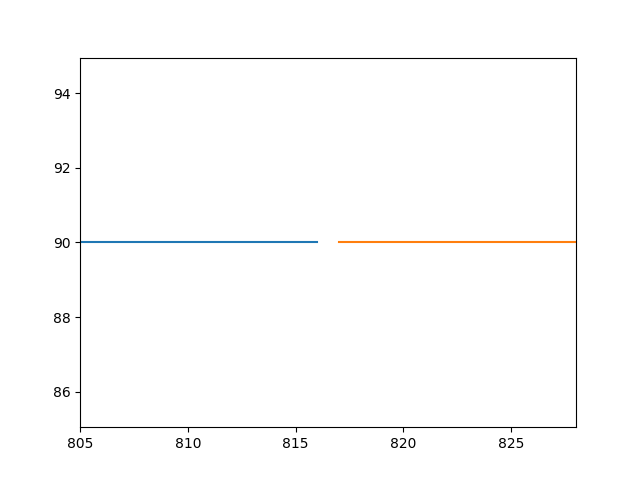

0 12
12 24
8


<IPython.core.display.Javascript object>


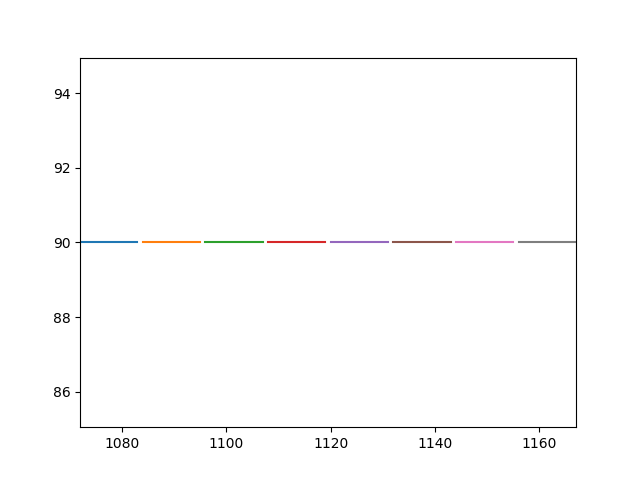

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
24


<IPython.core.display.Javascript object>


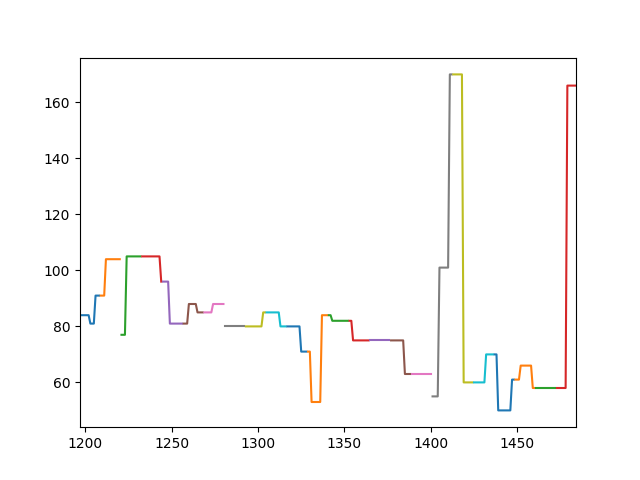

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
20


<IPython.core.display.Javascript object>


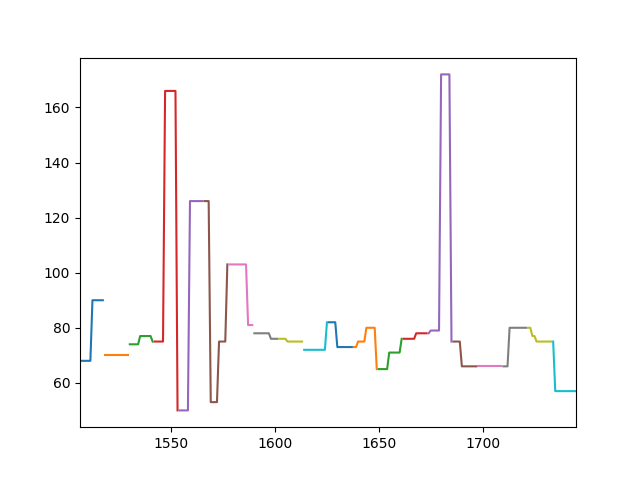

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
1


<IPython.core.display.Javascript object>


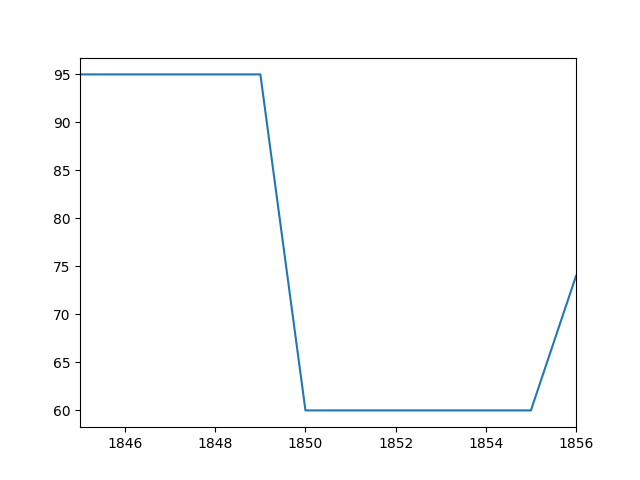

0 12
29


<IPython.core.display.Javascript object>


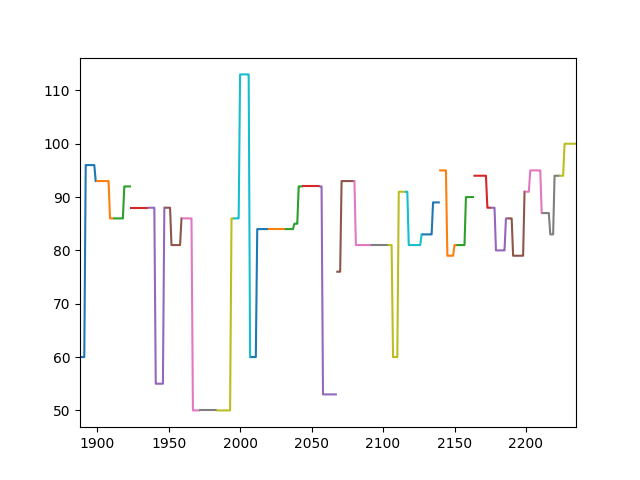

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
0


<IPython.core.display.Javascript object>


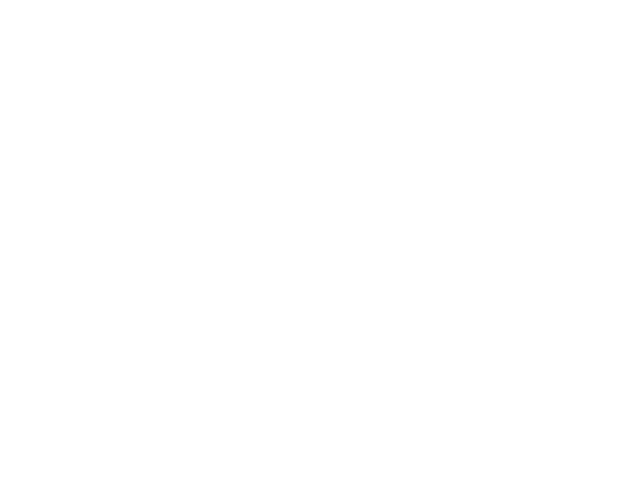

5


<IPython.core.display.Javascript object>


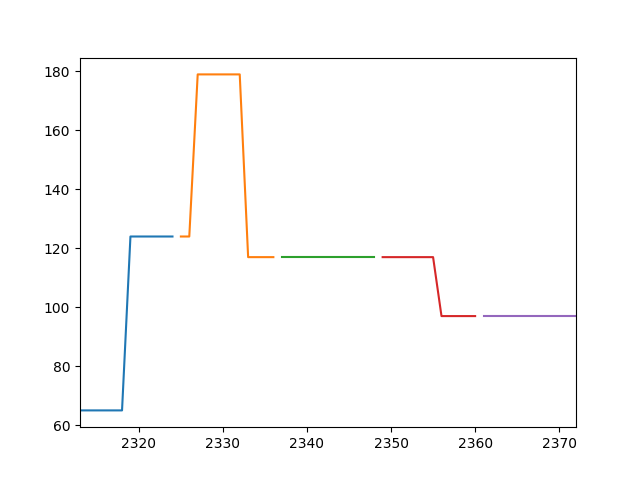

0 12
12 24
24 36
36 48
48 60
32


<IPython.core.display.Javascript object>


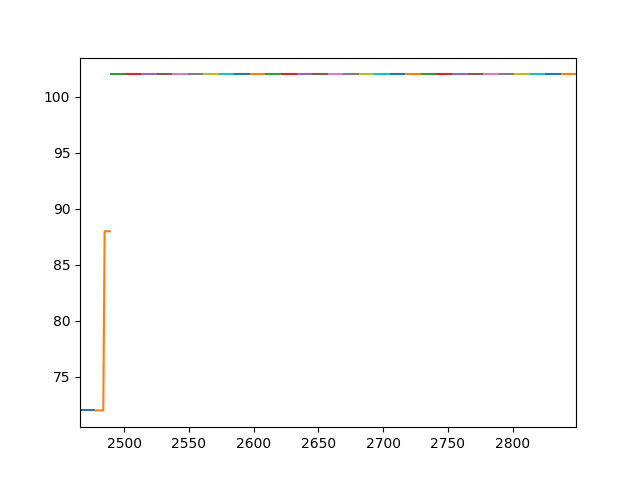

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
8


<IPython.core.display.Javascript object>


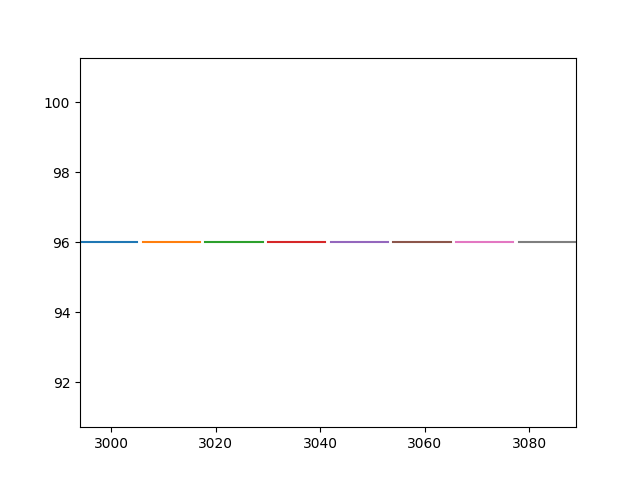

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
61


<IPython.core.display.Javascript object>


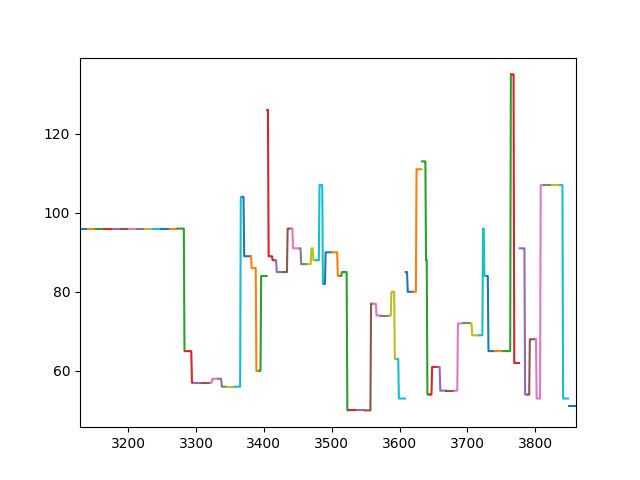

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
15


<IPython.core.display.Javascript object>


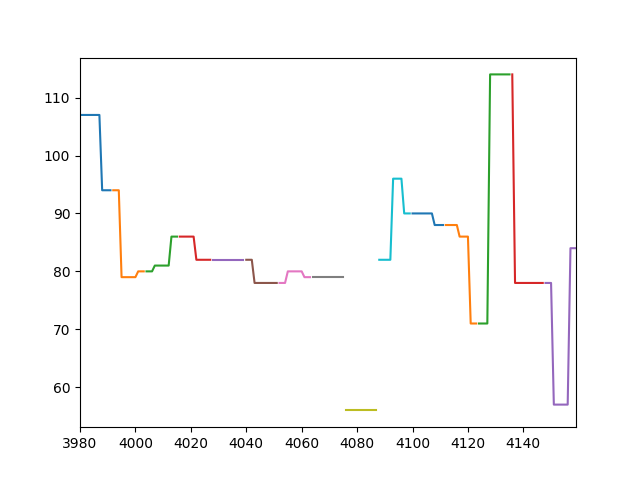

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
8


<IPython.core.display.Javascript object>


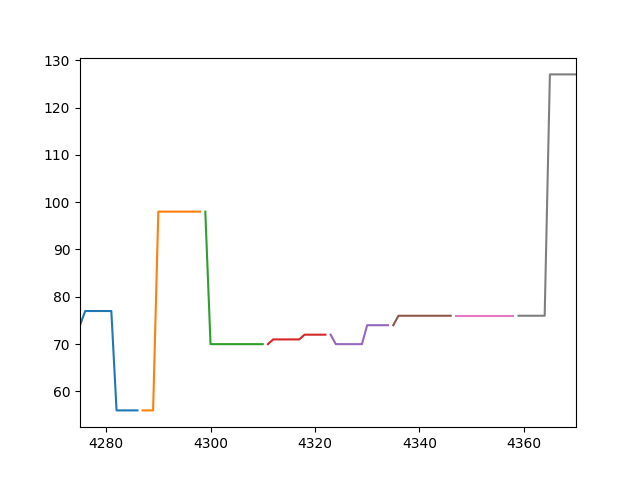

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
29


<IPython.core.display.Javascript object>


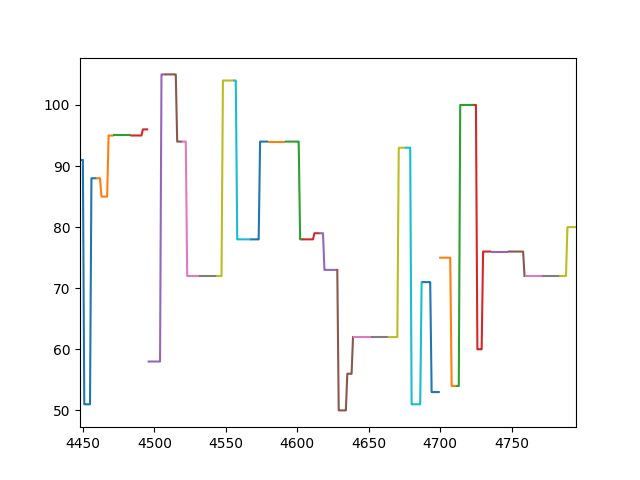

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
14


/home/james/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


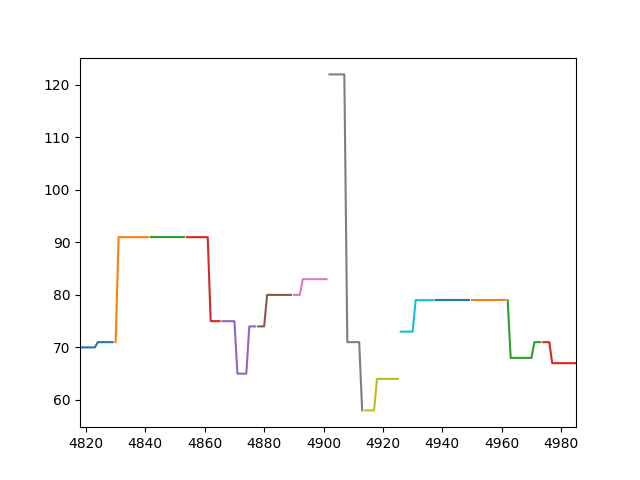

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
0


<IPython.core.display.Javascript object>


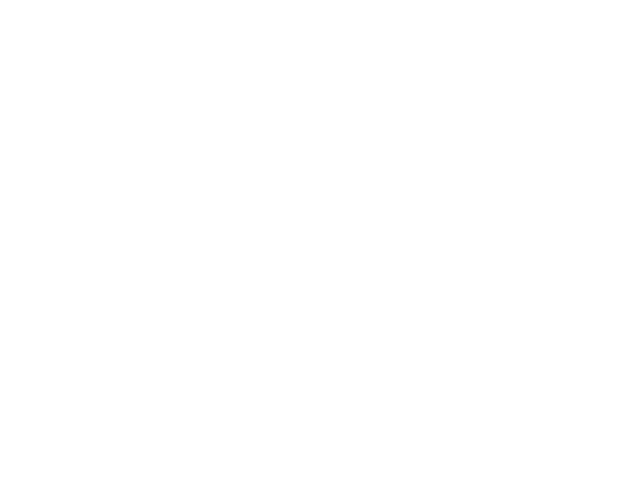

34


<IPython.core.display.Javascript object>


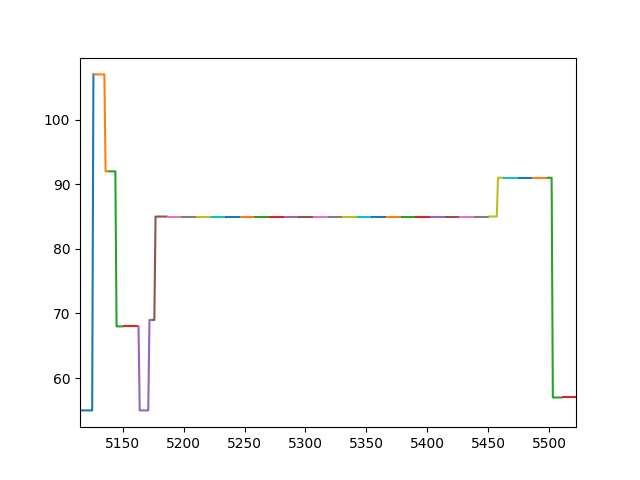

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
27


<IPython.core.display.Javascript object>


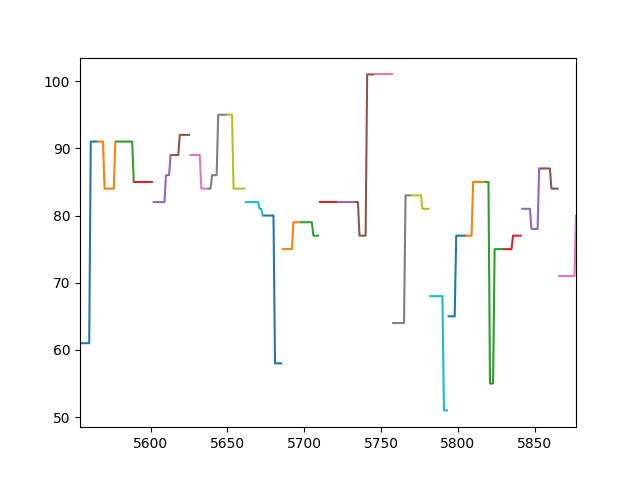

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
1


<IPython.core.display.Javascript object>


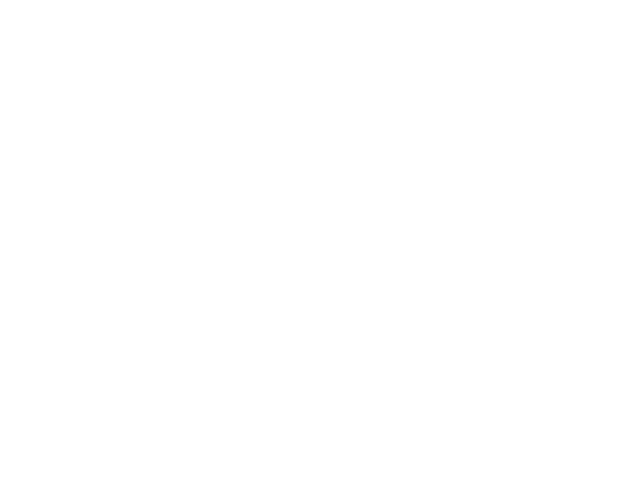

0 12
1


<IPython.core.display.Javascript object>


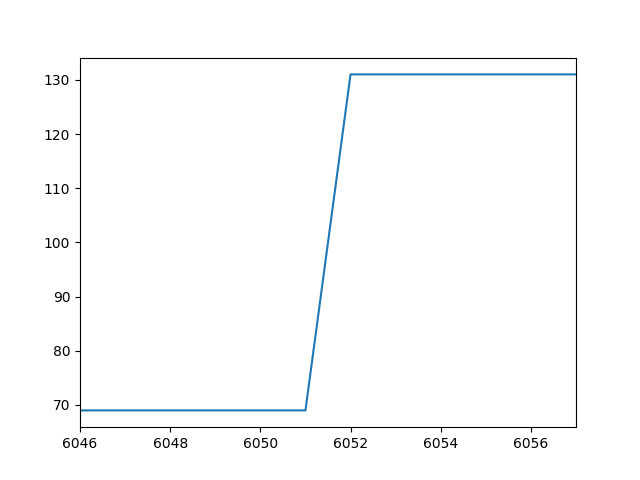

0 12
5


<IPython.core.display.Javascript object>


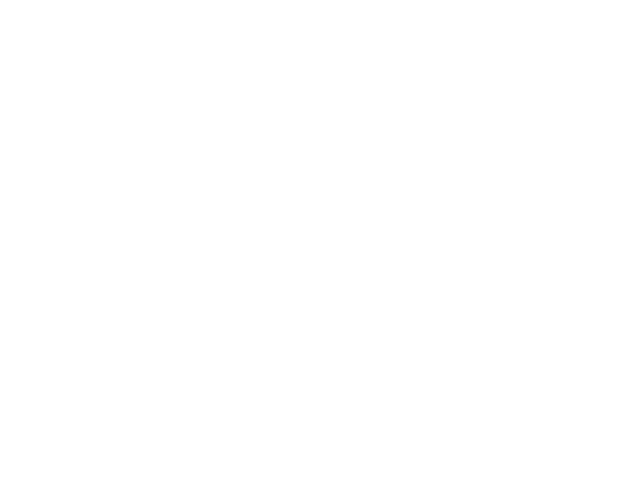

0 12
12 24
24 36
36 48
48 60
2


<IPython.core.display.Javascript object>


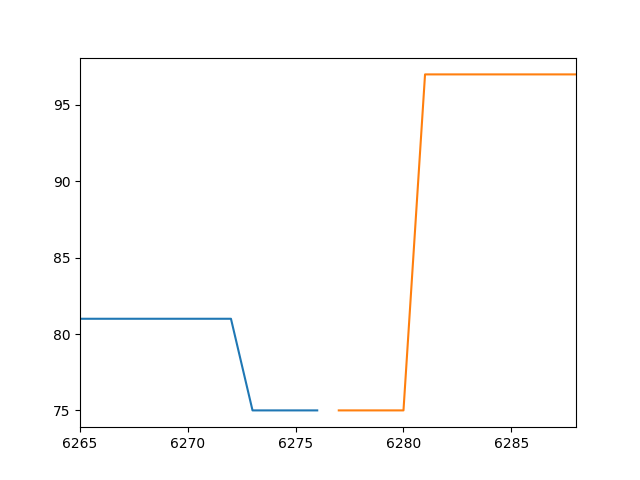

0 12
12 24
5


<IPython.core.display.Javascript object>


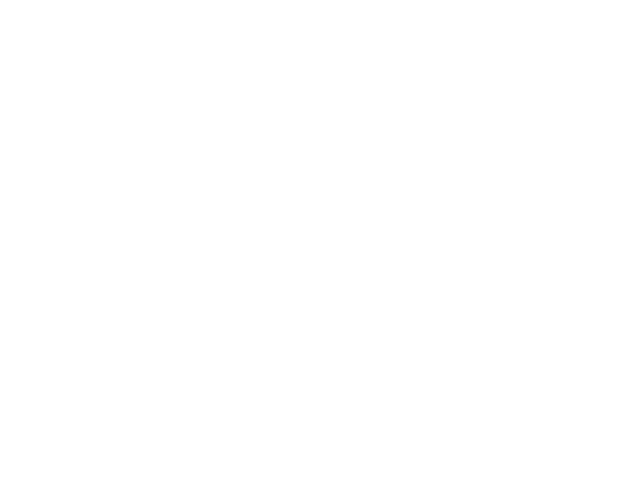

0 12
12 24
24 36
36 48
48 60
2


<IPython.core.display.Javascript object>


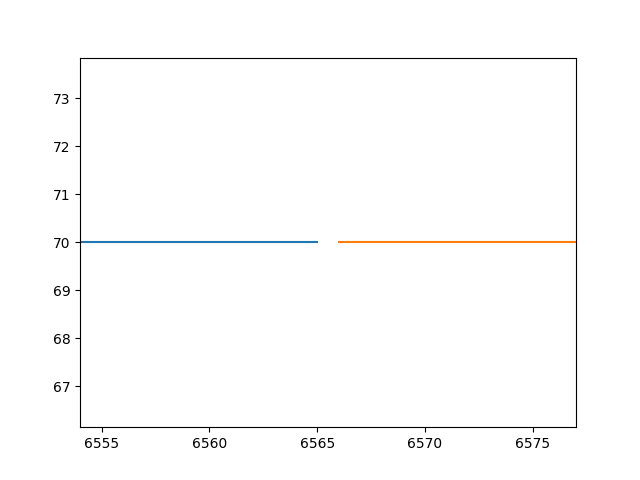

0 12
12 24
0


<IPython.core.display.Javascript object>


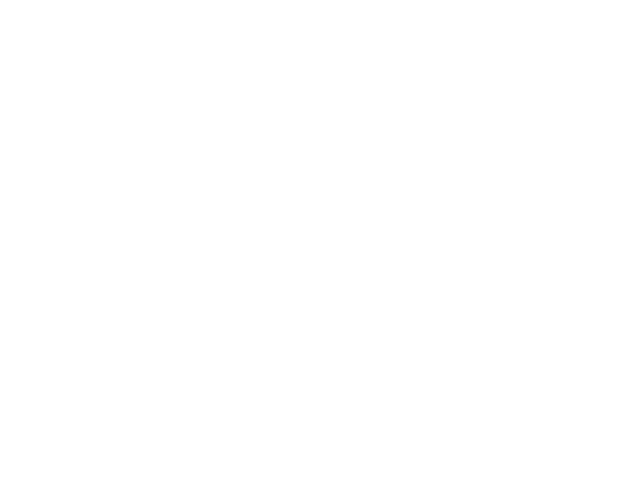

5


<IPython.core.display.Javascript object>


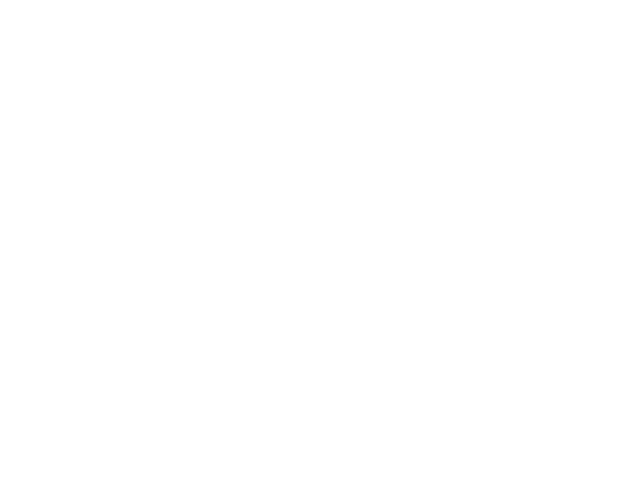

0 12
12 24
24 36
36 48
48 60
4


<IPython.core.display.Javascript object>


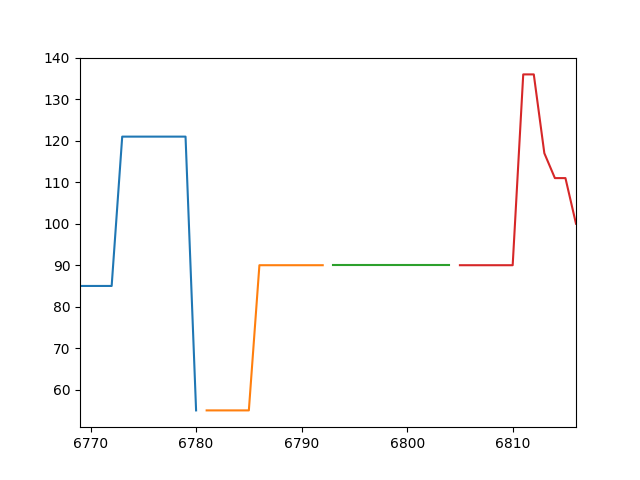

0 12
12 24
24 36
36 48
5


<IPython.core.display.Javascript object>


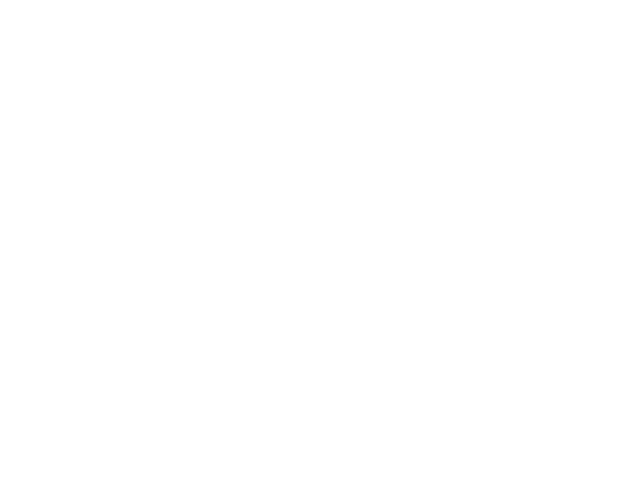

0 12
12 24
24 36
36 48
48 60
11


<IPython.core.display.Javascript object>


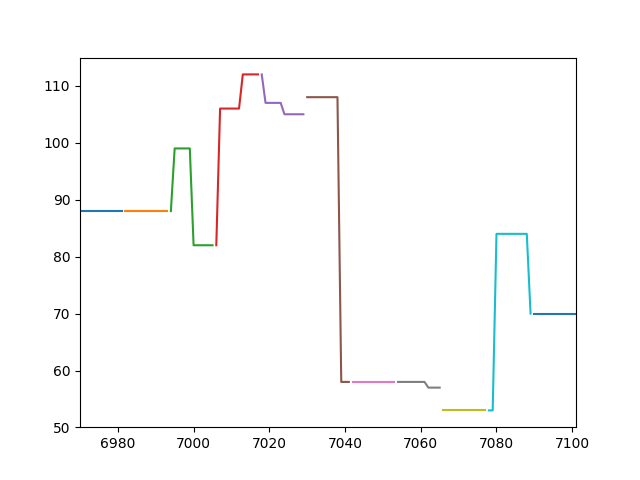

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
0


<IPython.core.display.Javascript object>


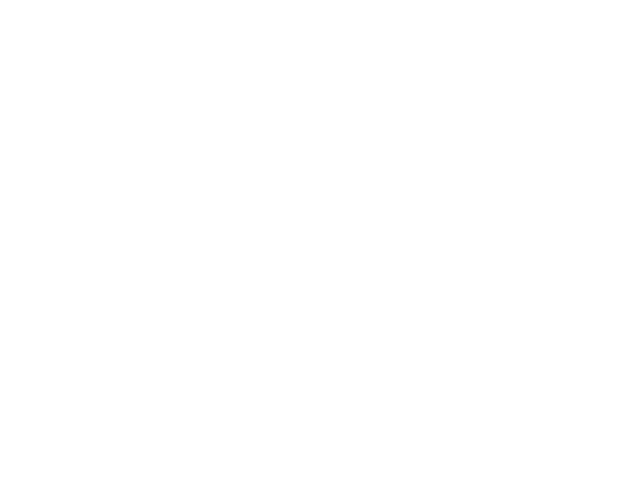

2


<IPython.core.display.Javascript object>


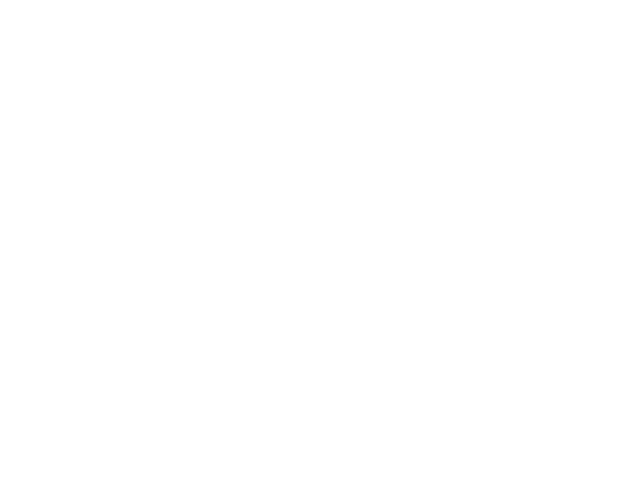

0 12
12 24
11


<IPython.core.display.Javascript object>


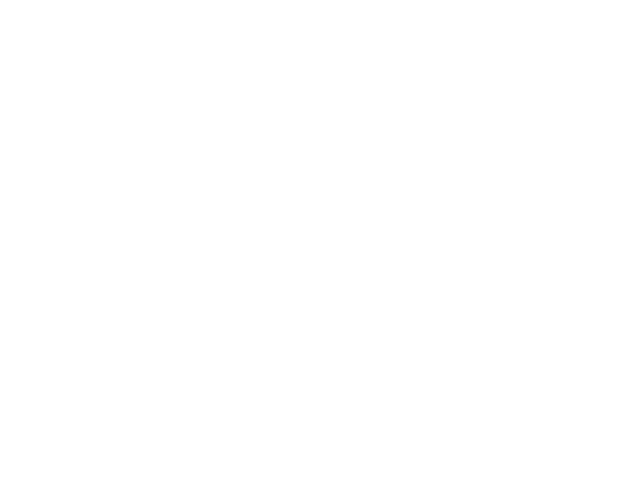

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
9


<IPython.core.display.Javascript object>


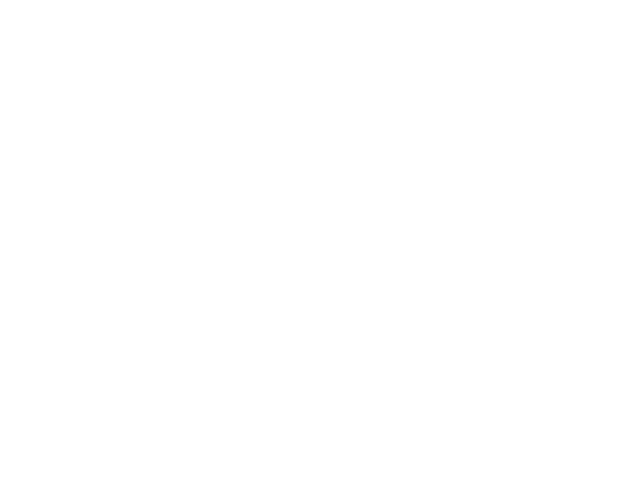

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
2


<IPython.core.display.Javascript object>


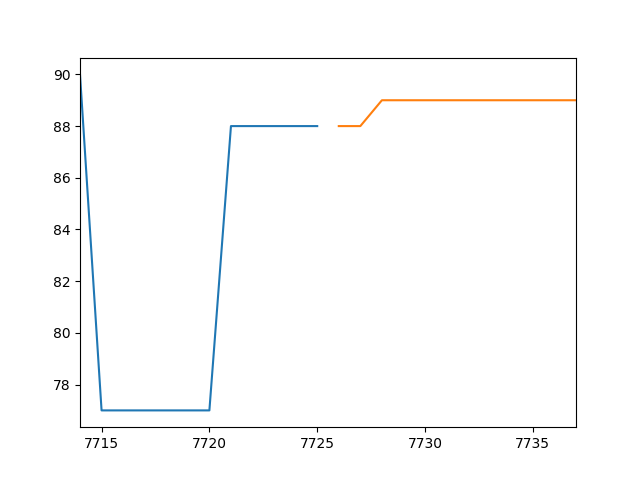

0 12
12 24
7


<IPython.core.display.Javascript object>


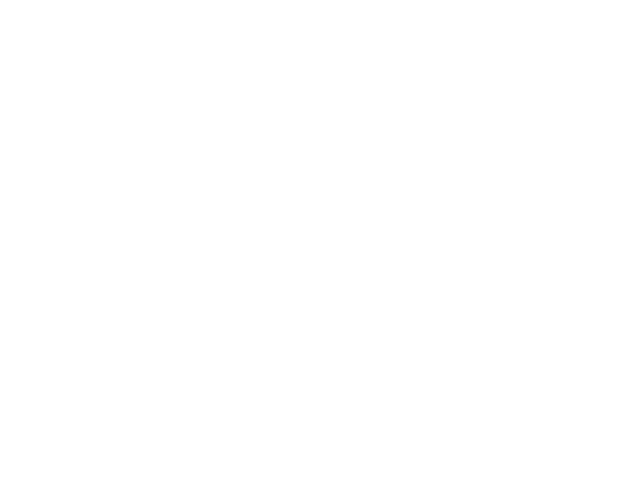

0 12
12 24
24 36
36 48
48 60
60 72
72 84
2


<IPython.core.display.Javascript object>


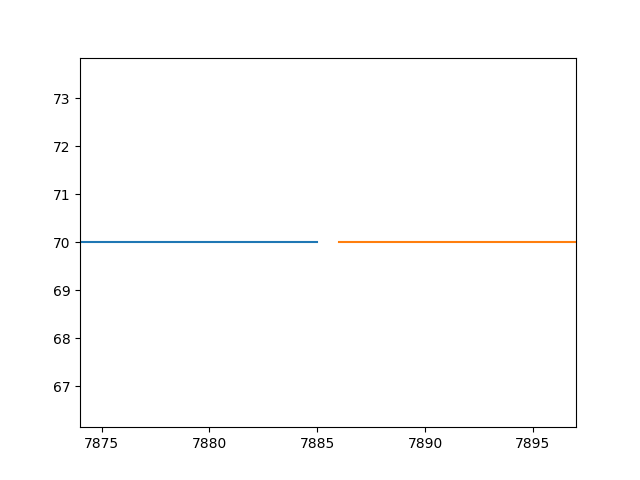

0 12
12 24
37


<IPython.core.display.Javascript object>


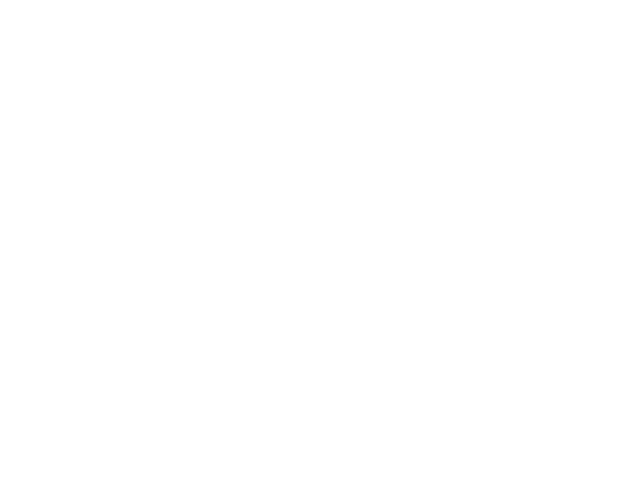

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
1


<IPython.core.display.Javascript object>


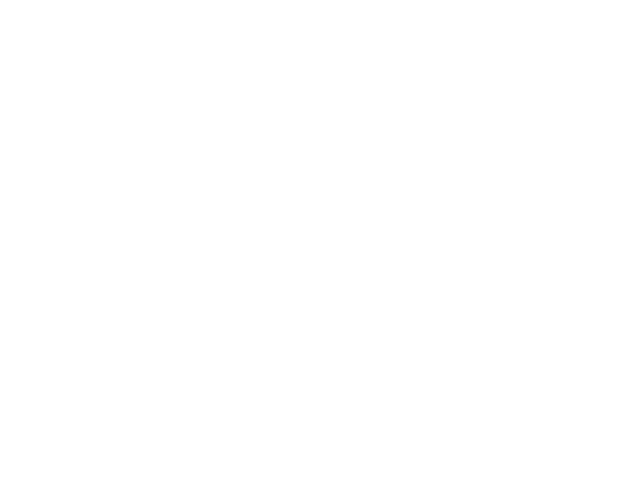

0 12
4


<IPython.core.display.Javascript object>


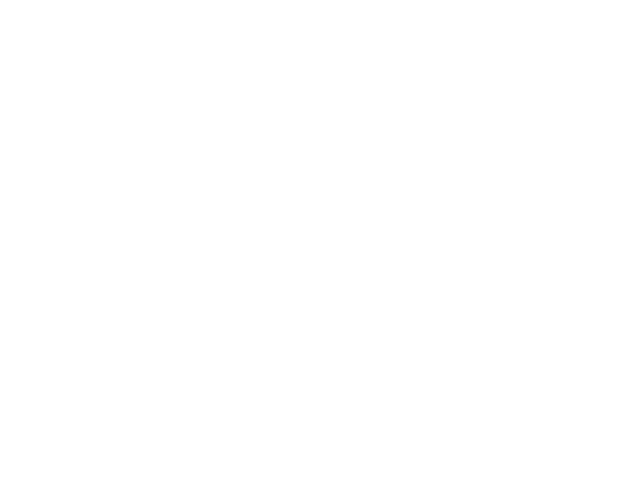

0 12
12 24
24 36
36 48
12


<IPython.core.display.Javascript object>


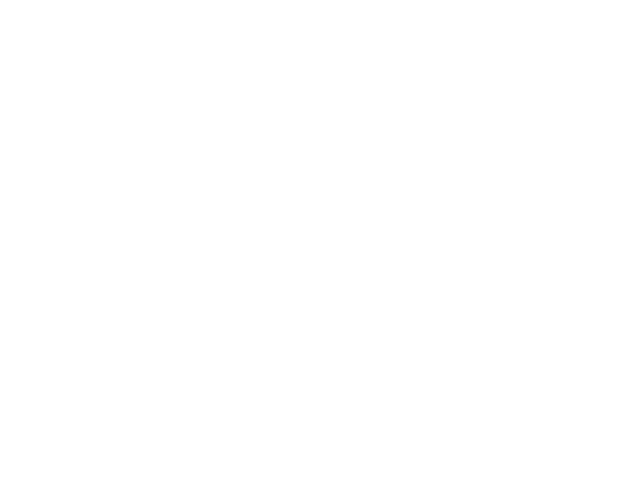

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
3


<IPython.core.display.Javascript object>


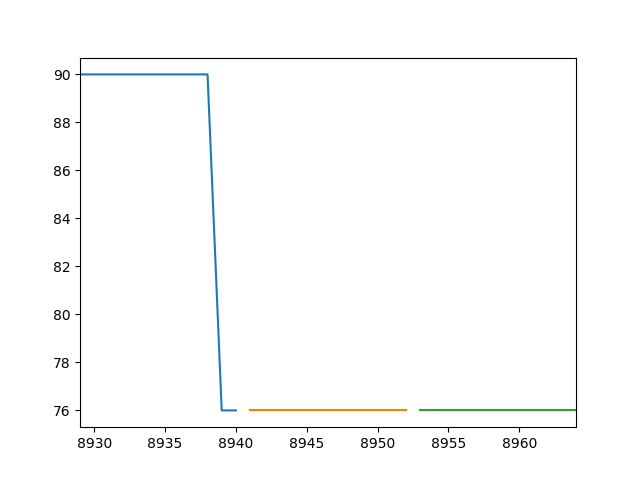

0 12
12 24
24 36
10


<IPython.core.display.Javascript object>


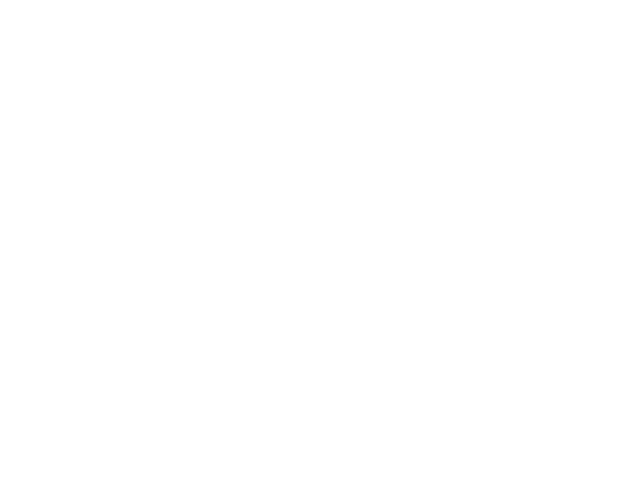

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
3


<IPython.core.display.Javascript object>


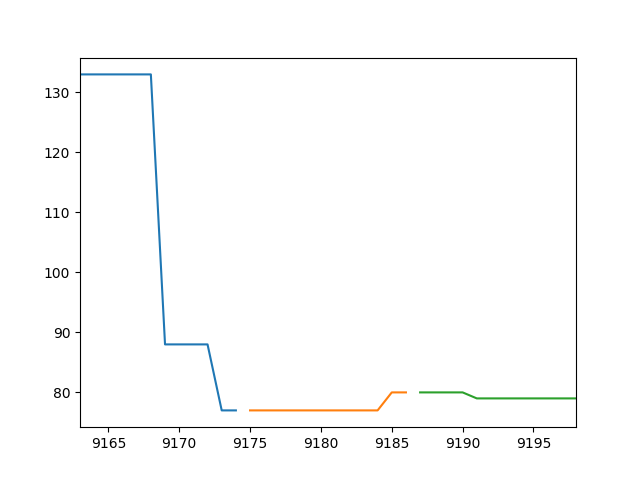

0 12
12 24
24 36
3


<IPython.core.display.Javascript object>


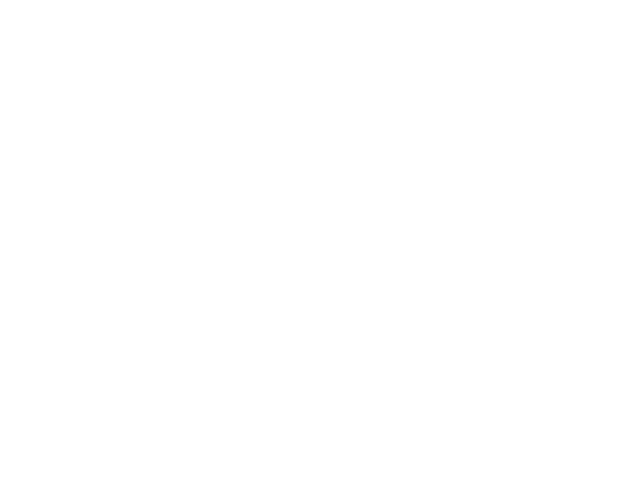

0 12
12 24
24 36
5


<IPython.core.display.Javascript object>


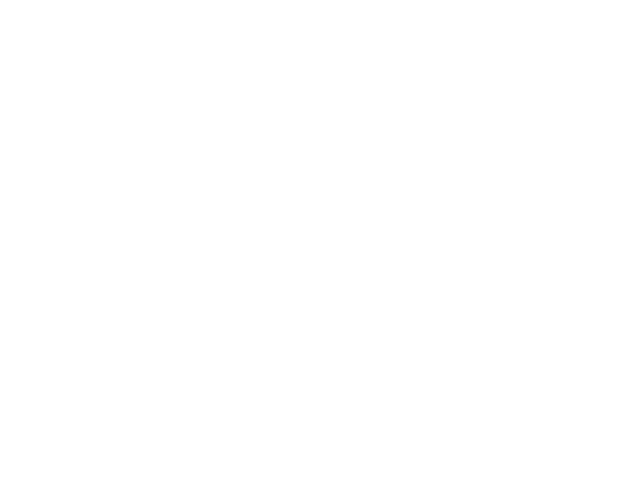

0 12
12 24
24 36
36 48
48 60
19


<IPython.core.display.Javascript object>


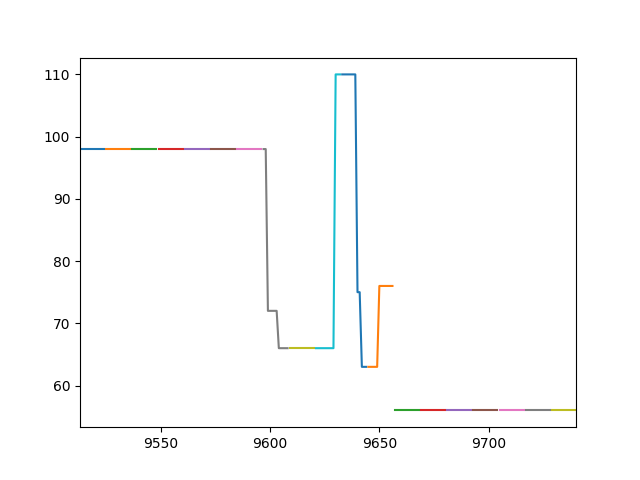

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
21


<IPython.core.display.Javascript object>


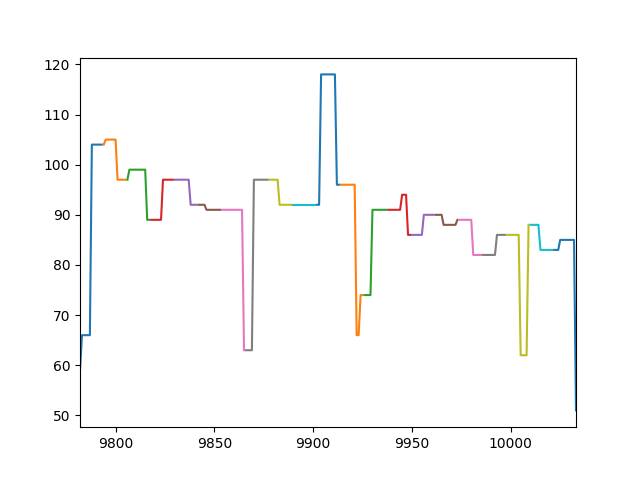

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
23


<IPython.core.display.Javascript object>


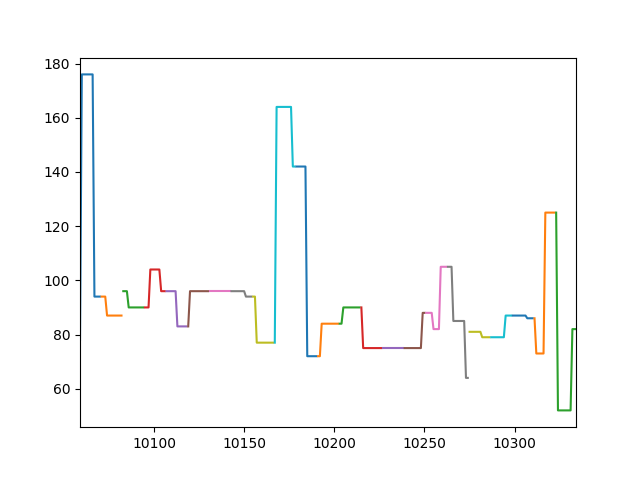

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
1


<IPython.core.display.Javascript object>


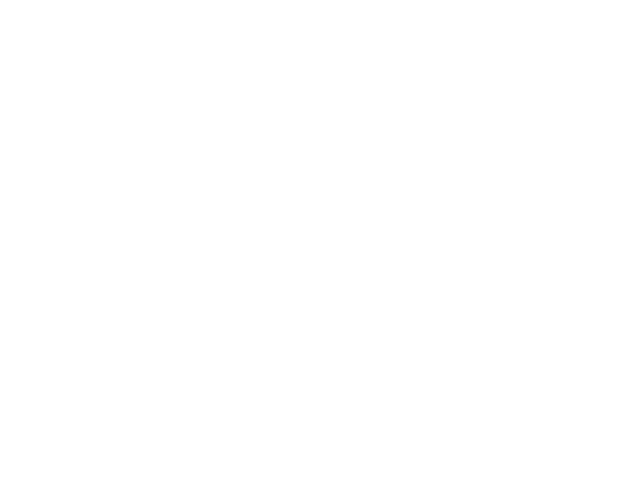

0 12
0


<IPython.core.display.Javascript object>


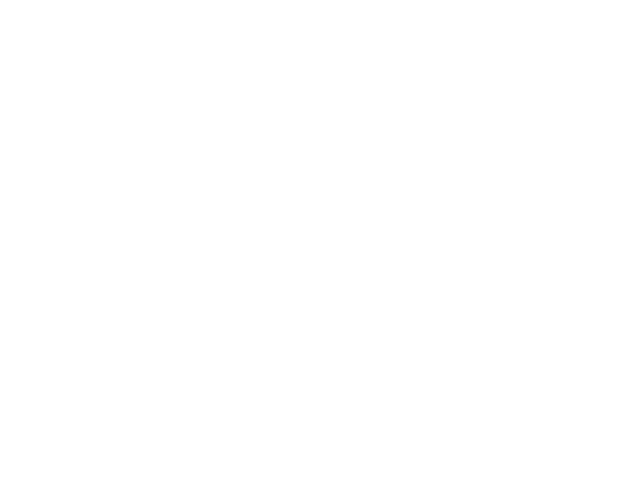

0


<IPython.core.display.Javascript object>


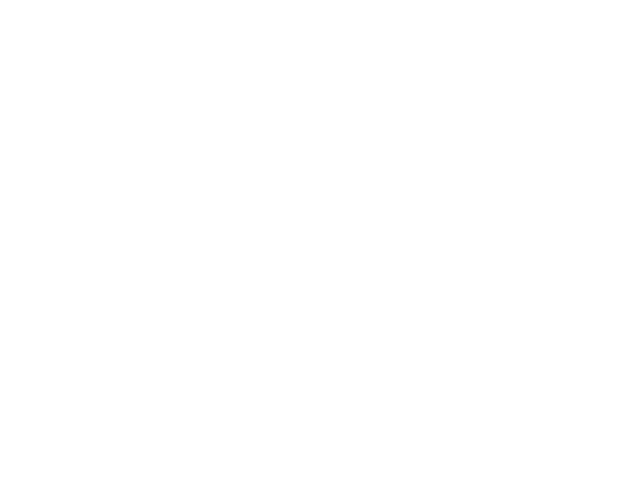

6


<IPython.core.display.Javascript object>


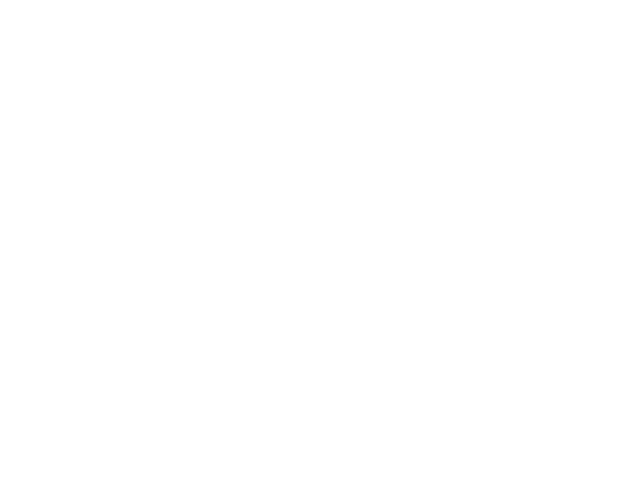

0 12
12 24
24 36
36 48
48 60
60 72
8


<IPython.core.display.Javascript object>


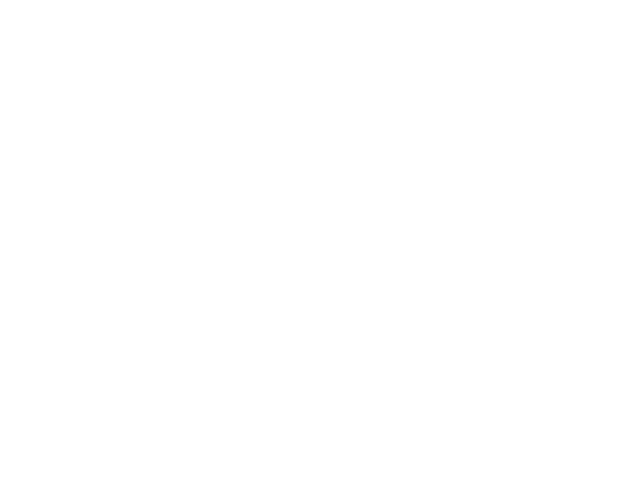

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
9


<IPython.core.display.Javascript object>


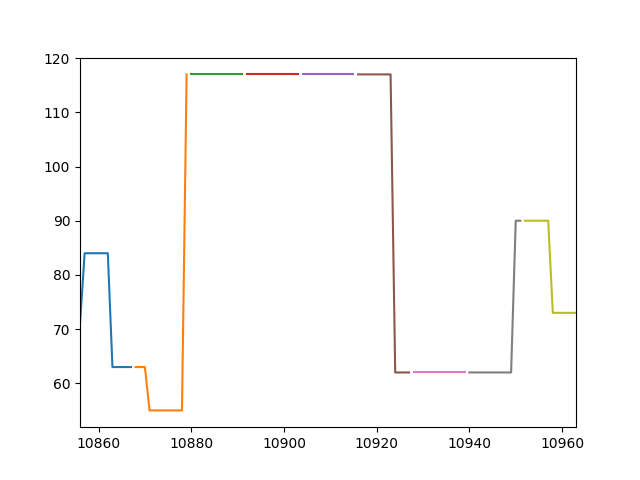

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
22


<IPython.core.display.Javascript object>


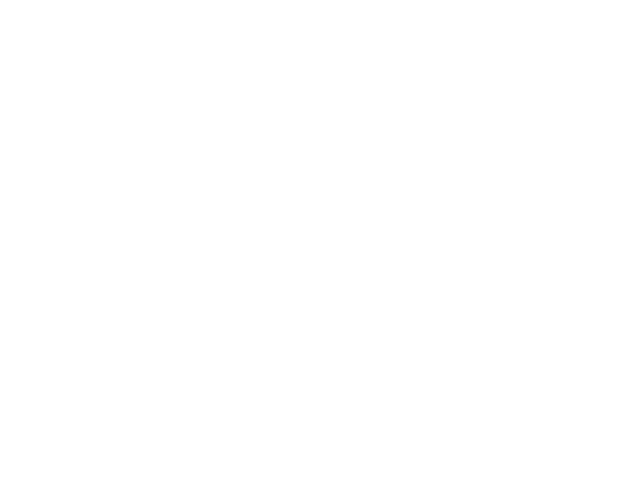

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
6


<IPython.core.display.Javascript object>


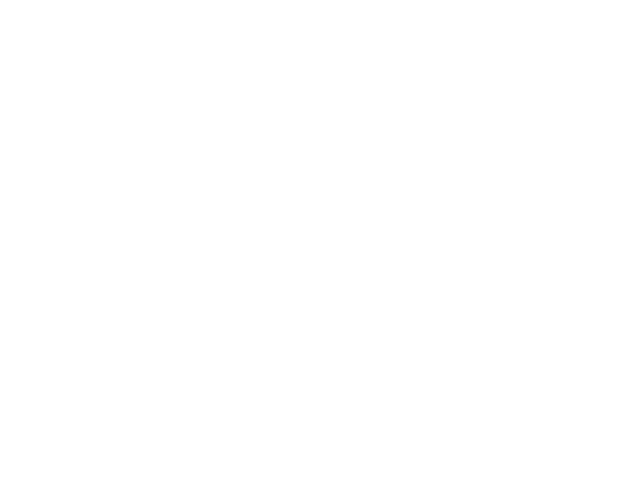

0 12
12 24
24 36
36 48
48 60
60 72
0


<IPython.core.display.Javascript object>


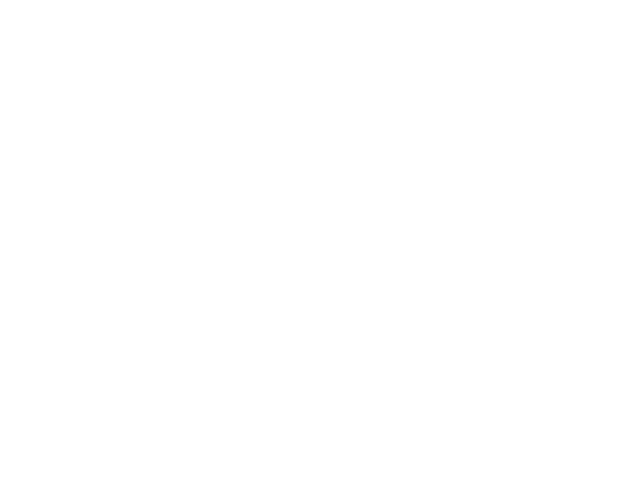

20


<IPython.core.display.Javascript object>


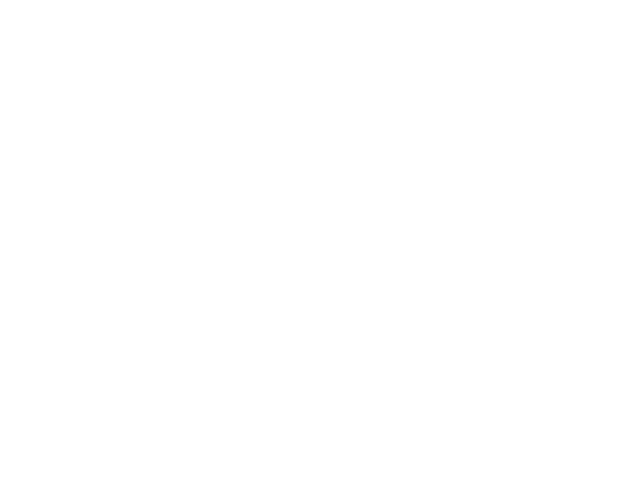

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
1


<IPython.core.display.Javascript object>


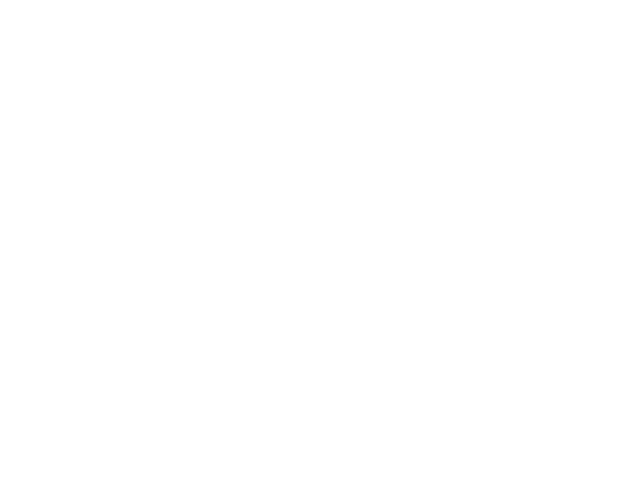

0 12
223


<IPython.core.display.Javascript object>


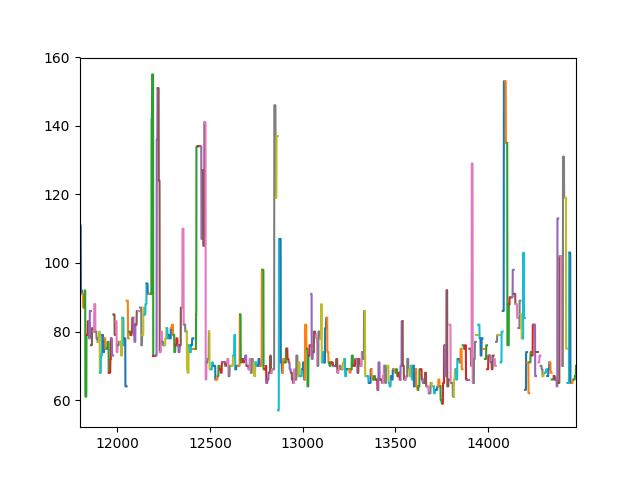

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
732 744
744 756
756 768
768 780
780 792
792 804
804 816
816 828
828 840
840 852
852 864
864 876
876 888
888 900
900 912
912 924
924 936
936 948
948 960
960 972
972 984
984 996
996 1008
1008 1020
1020 1032
1032 1044
1044 1056
1056 1068
1068 1080
1080 1092
1092 1104
1104 1116
1116 1128
1128 1140
1140 1152
1152 1164
1164 1176
1176 1188
1188 1200
1200 1212
1212 1224
1224 1236
1236 1248
1248 1260
1260 1272
1272 1284
1284 1296
1296 1308
1308 1320
1320 1332
1332 1344
1344 1356
1356 1368
1368 1380
1380 1392
1392 1404
1404 1416
1416 

<IPython.core.display.Javascript object>


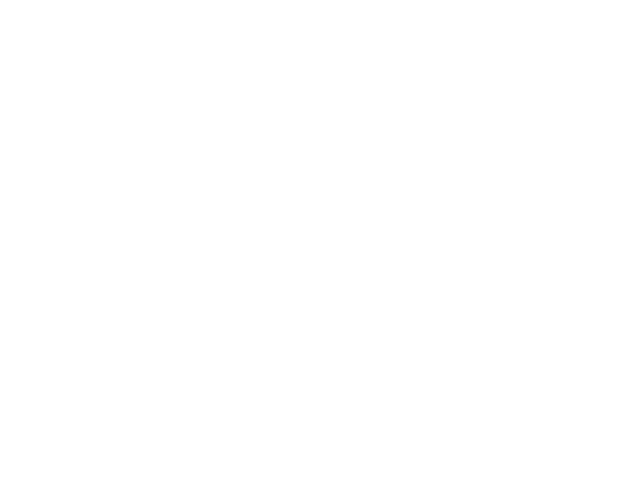

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
40


<IPython.core.display.Javascript object>


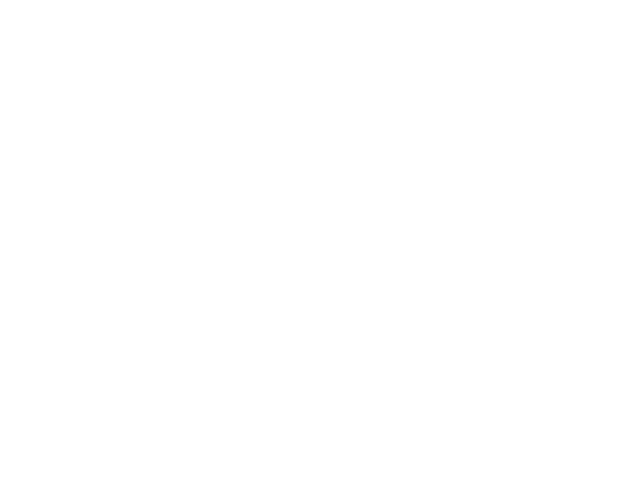

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
11


<IPython.core.display.Javascript object>


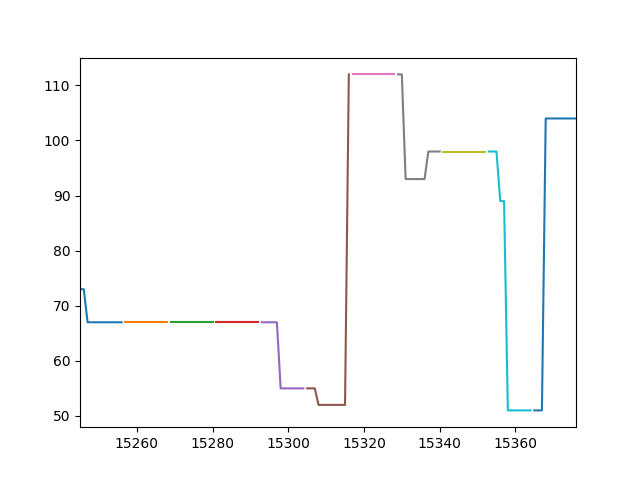

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
1


<IPython.core.display.Javascript object>


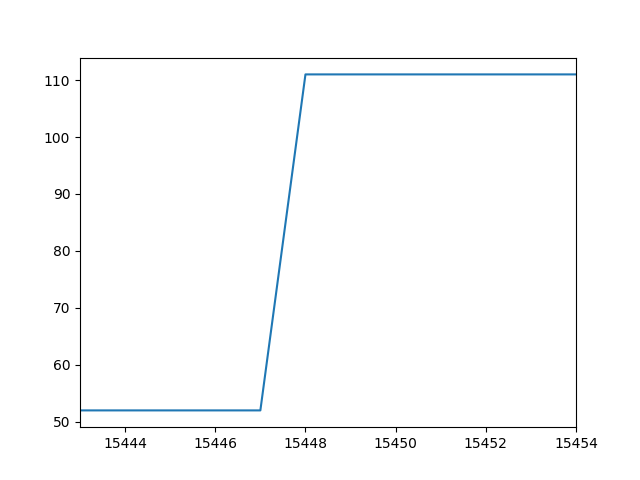

0 12
0


<IPython.core.display.Javascript object>


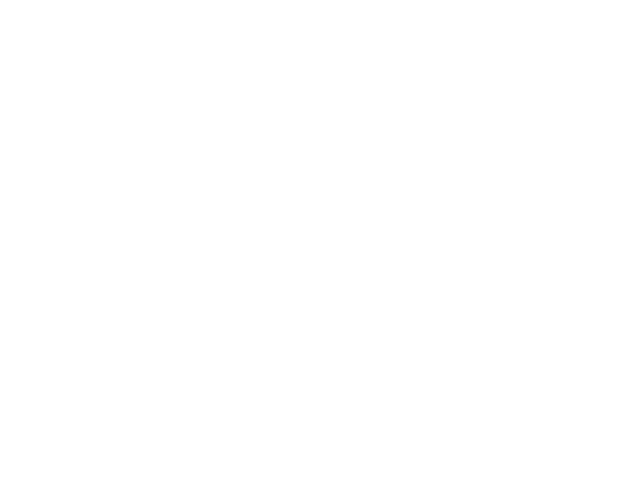

0


<IPython.core.display.Javascript object>


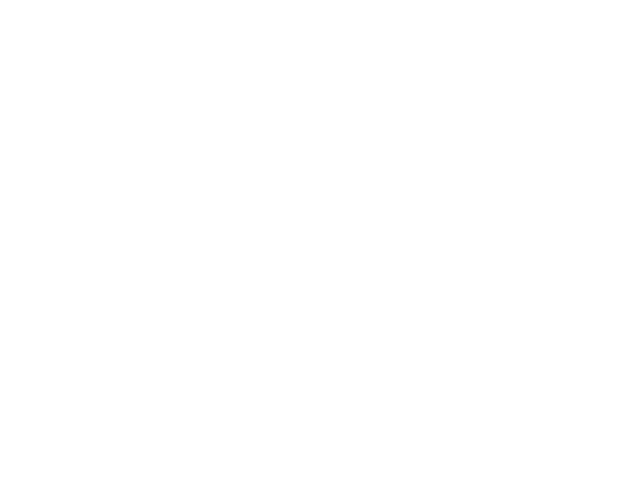

3


<IPython.core.display.Javascript object>


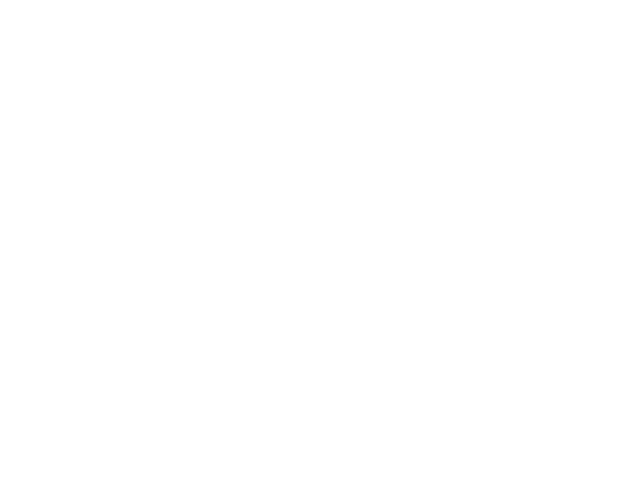

0 12
12 24
24 36
35


<IPython.core.display.Javascript object>


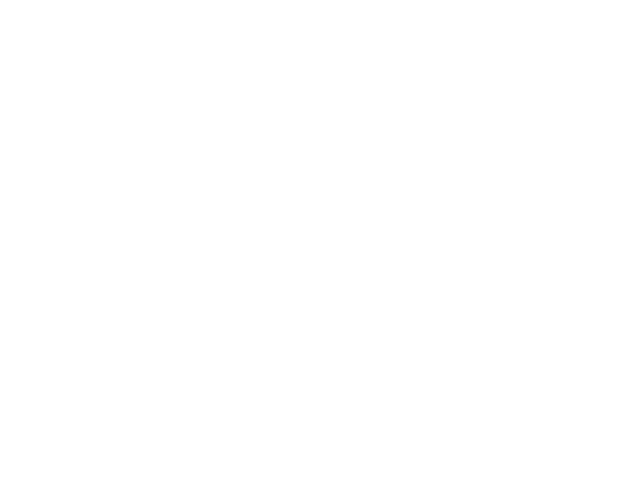

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
21


<IPython.core.display.Javascript object>


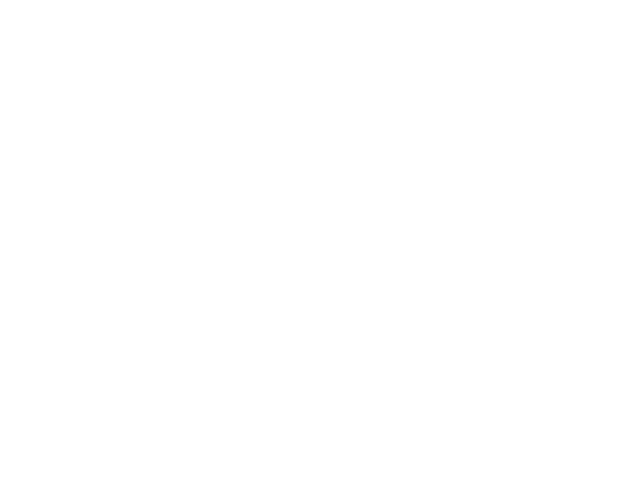

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
23


<IPython.core.display.Javascript object>


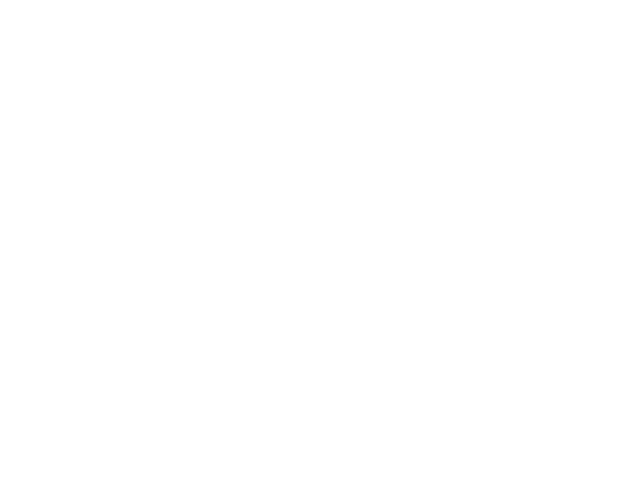

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
4


<IPython.core.display.Javascript object>


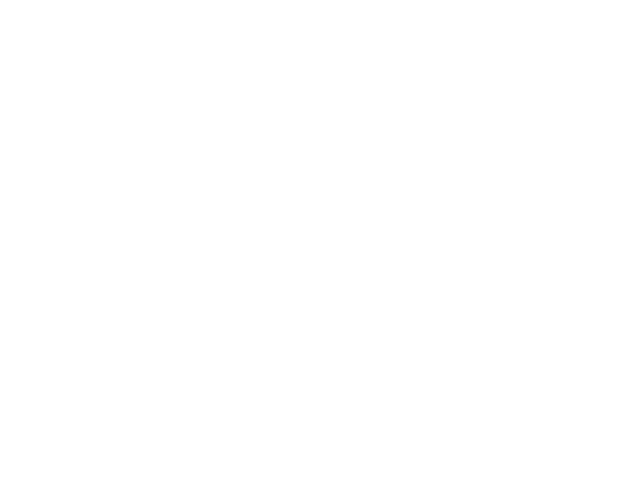

0 12
12 24
24 36
36 48
15


<IPython.core.display.Javascript object>


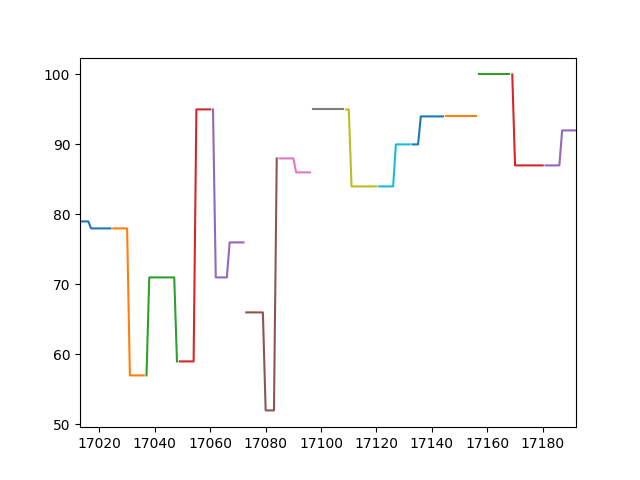

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
5


<IPython.core.display.Javascript object>


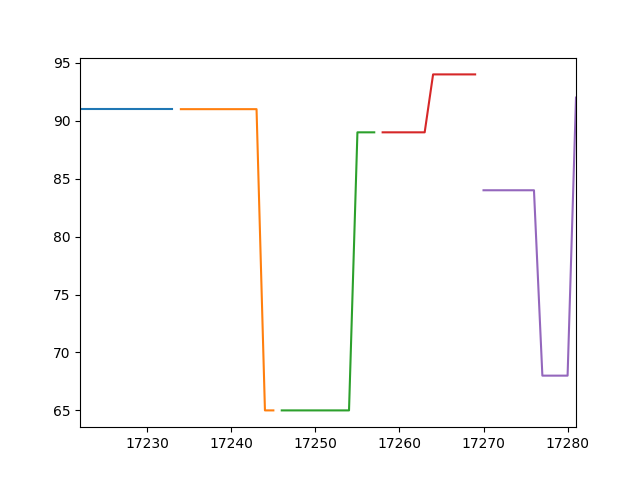

0 12
12 24
24 36
36 48
48 60
13


<IPython.core.display.Javascript object>


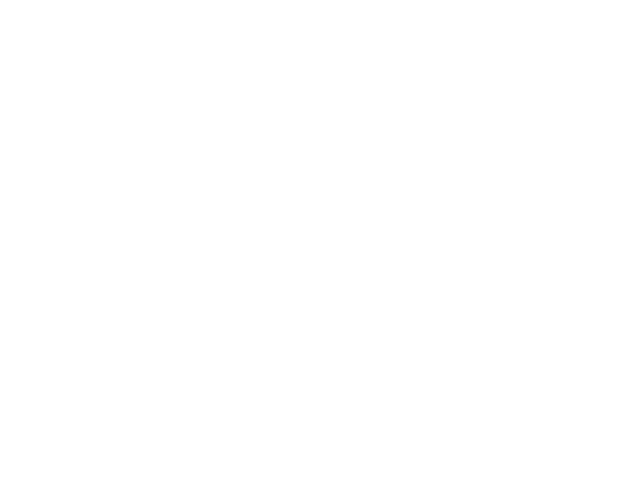

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
11


<IPython.core.display.Javascript object>


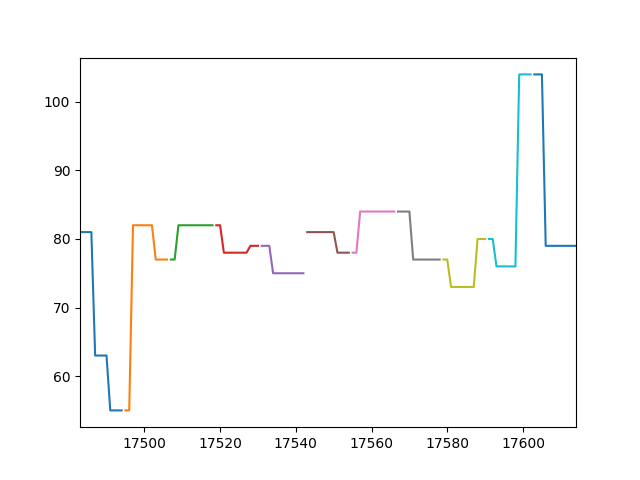

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
5


<IPython.core.display.Javascript object>


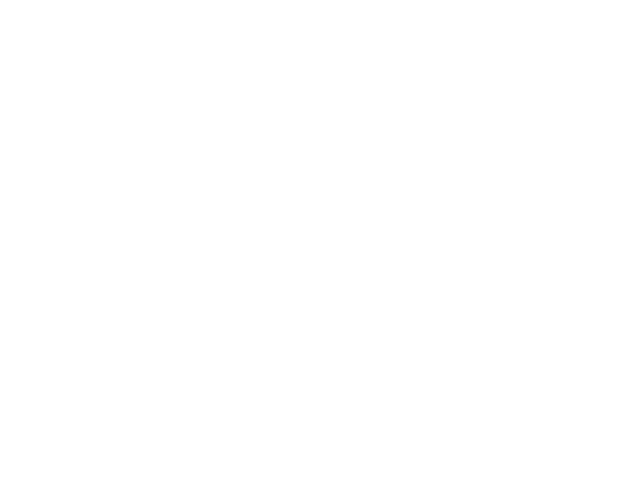

0 12
12 24
24 36
36 48
48 60
28


<IPython.core.display.Javascript object>


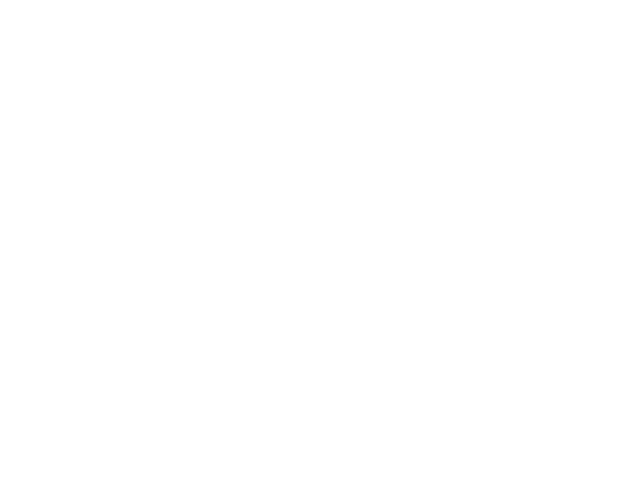

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
1


<IPython.core.display.Javascript object>


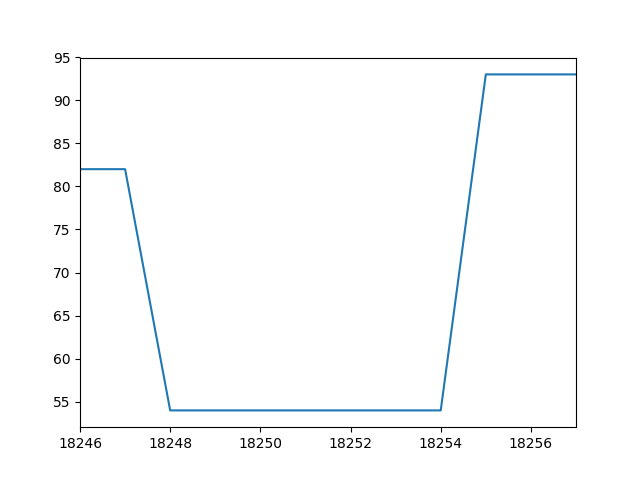

0 12
1


<IPython.core.display.Javascript object>


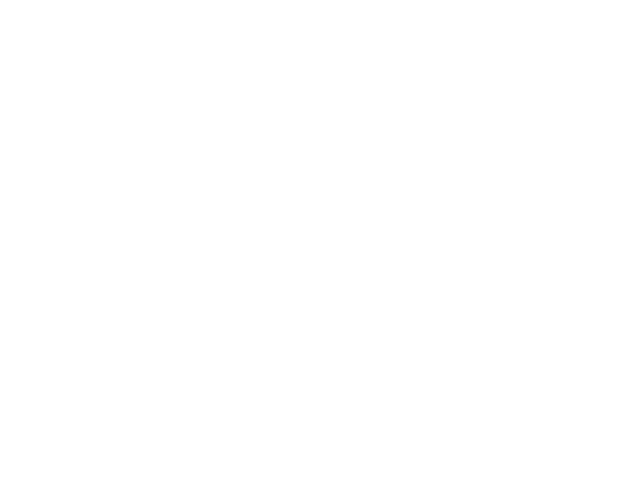

0 12
2


<IPython.core.display.Javascript object>


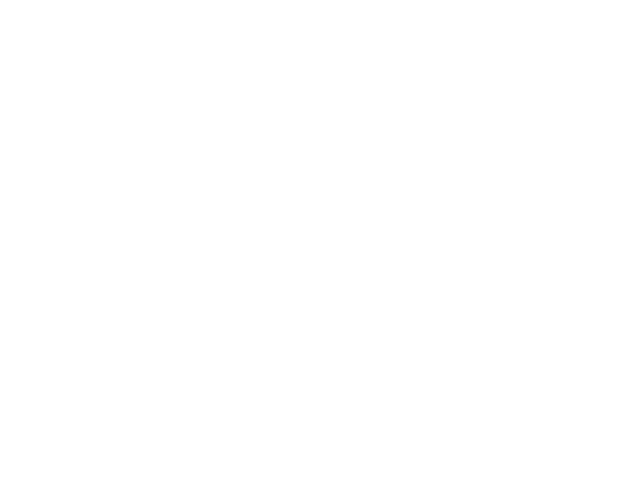

0 12
12 24
10


<IPython.core.display.Javascript object>


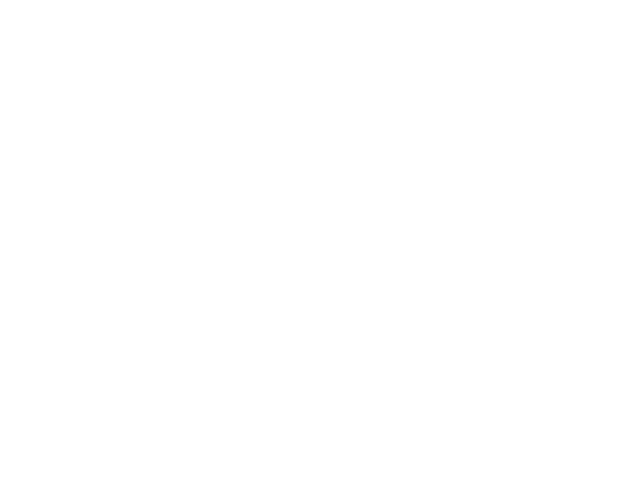

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
23


<IPython.core.display.Javascript object>


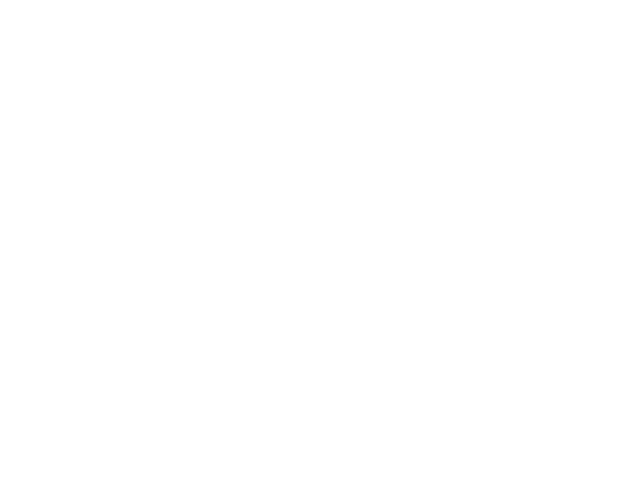

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
7


<IPython.core.display.Javascript object>


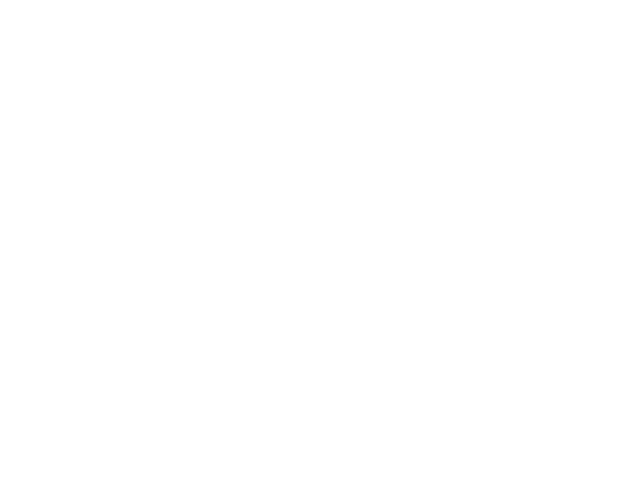

0 12
12 24
24 36
36 48
48 60
60 72
72 84
12


<IPython.core.display.Javascript object>


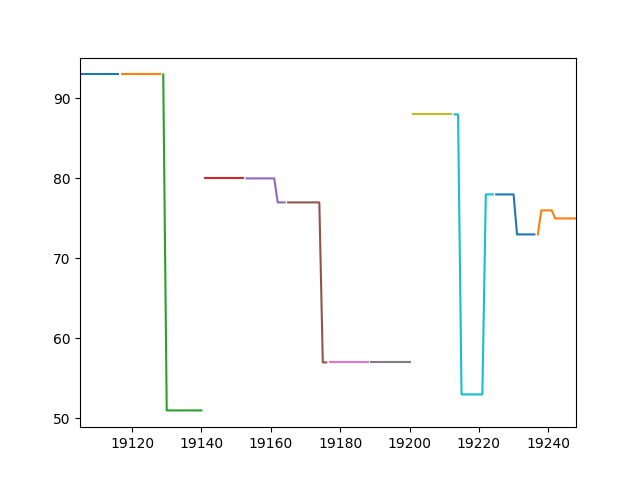

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
0


<IPython.core.display.Javascript object>


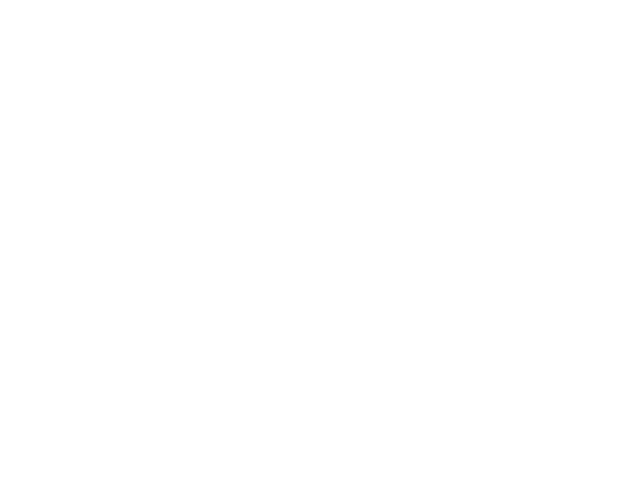

4


<IPython.core.display.Javascript object>


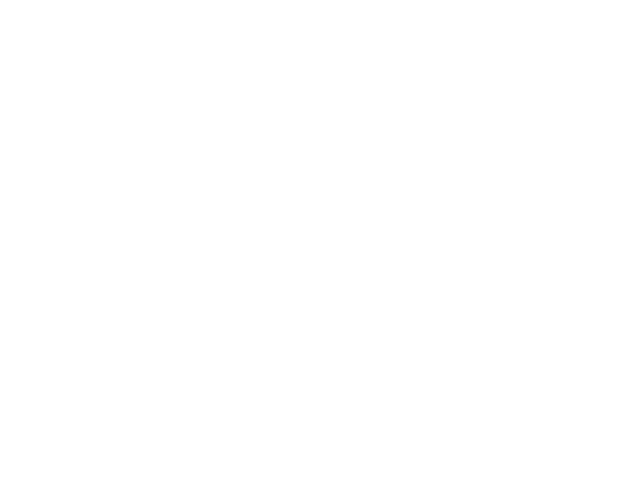

0 12
12 24
24 36
36 48
16


<IPython.core.display.Javascript object>


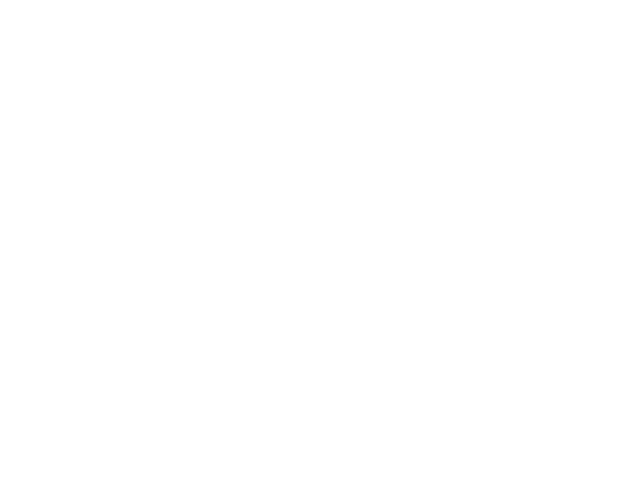

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
23


<IPython.core.display.Javascript object>


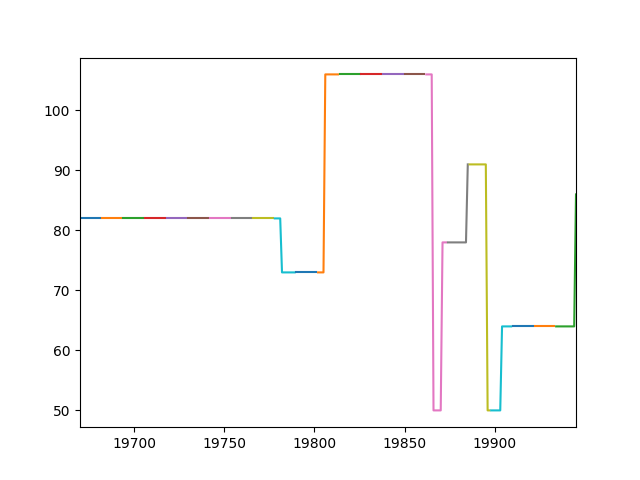

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
8


<IPython.core.display.Javascript object>


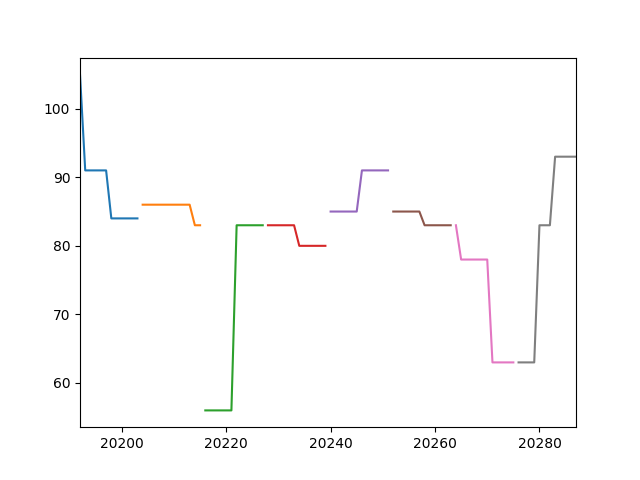

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
6


<IPython.core.display.Javascript object>


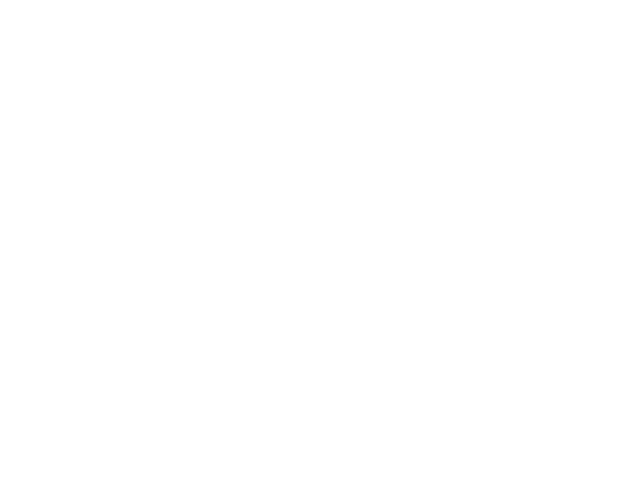

0 12
12 24
24 36
36 48
48 60
60 72
0


<IPython.core.display.Javascript object>


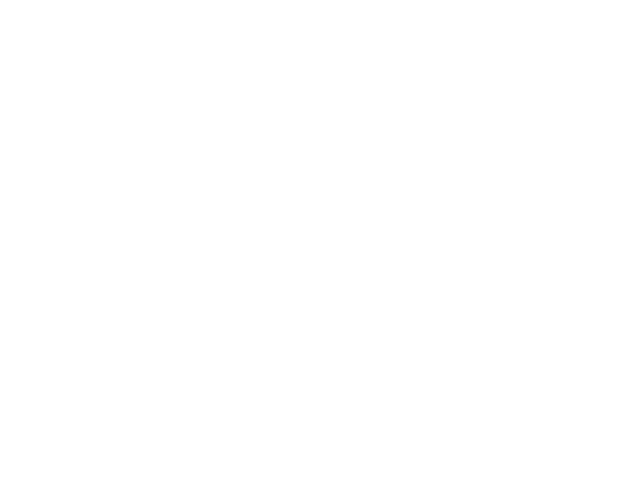

4


<IPython.core.display.Javascript object>


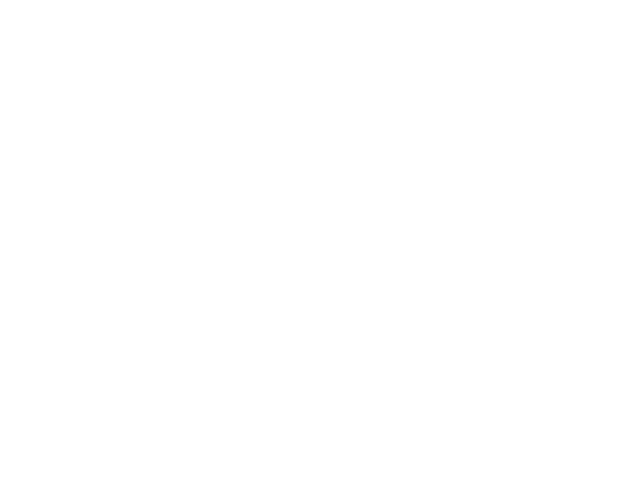

0 12
12 24
24 36
36 48
29


<IPython.core.display.Javascript object>


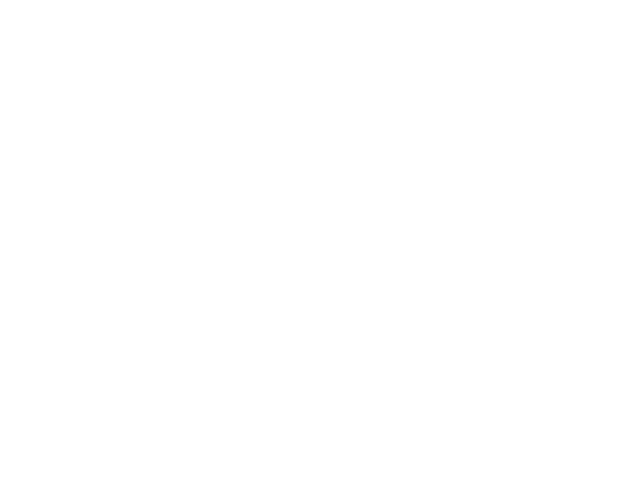

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
39


<IPython.core.display.Javascript object>


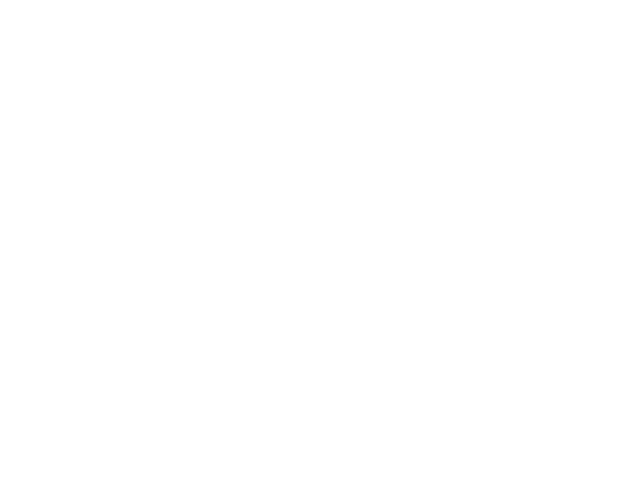

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
15


<IPython.core.display.Javascript object>


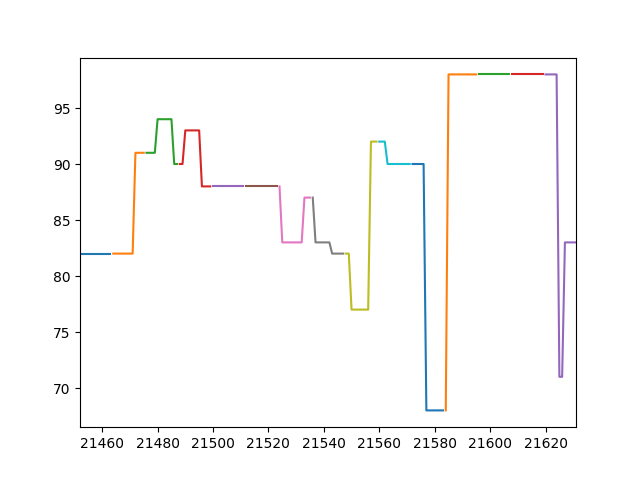

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
1


<IPython.core.display.Javascript object>


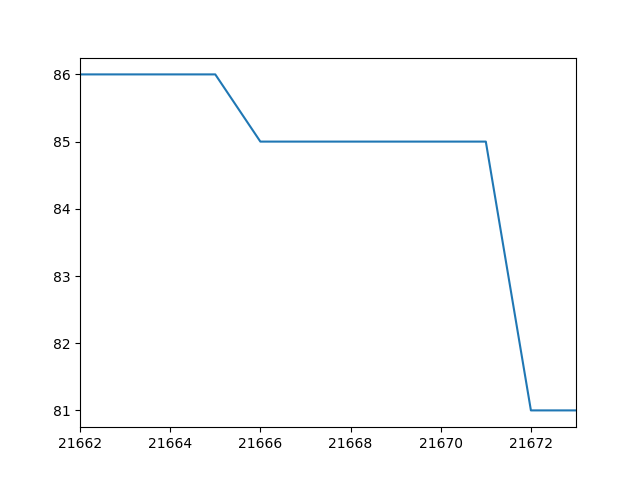

0 12
1


<IPython.core.display.Javascript object>


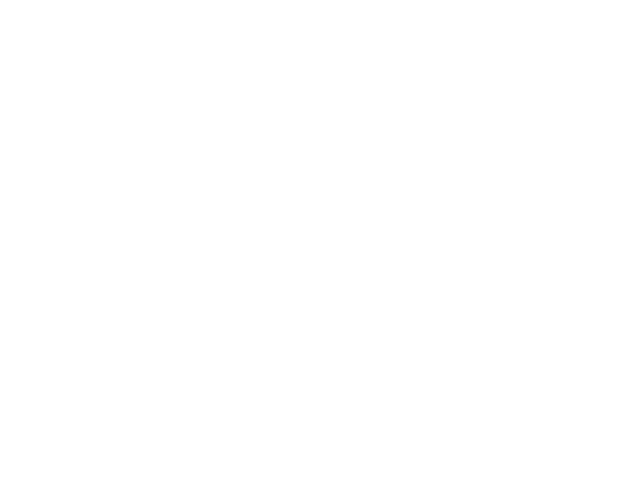

0 12
4


<IPython.core.display.Javascript object>


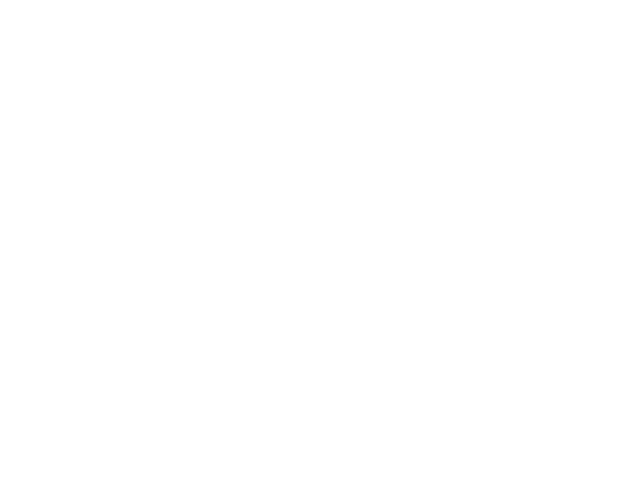

0 12
12 24
24 36
36 48
1


<IPython.core.display.Javascript object>


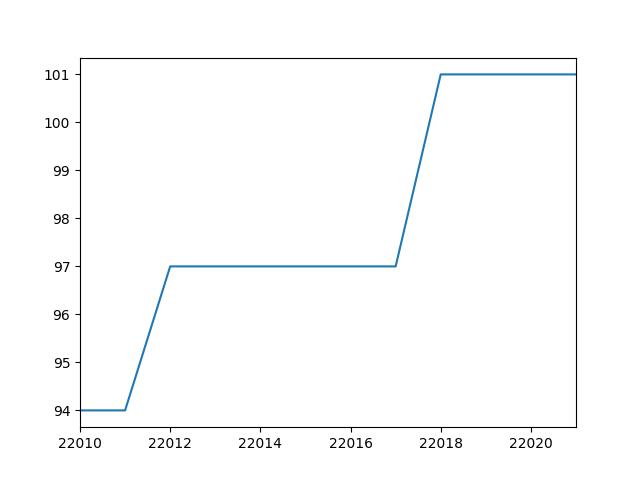

0 12
9


<IPython.core.display.Javascript object>


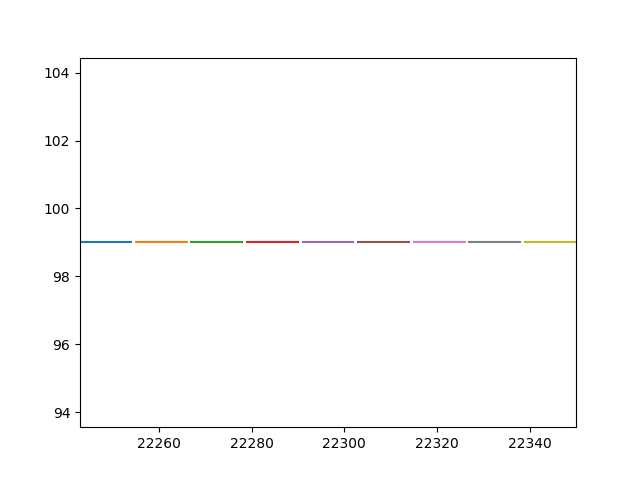

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
13


<IPython.core.display.Javascript object>


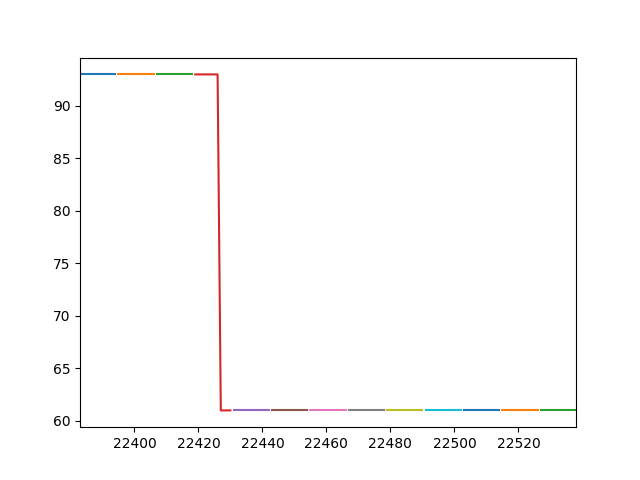

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
21


<IPython.core.display.Javascript object>


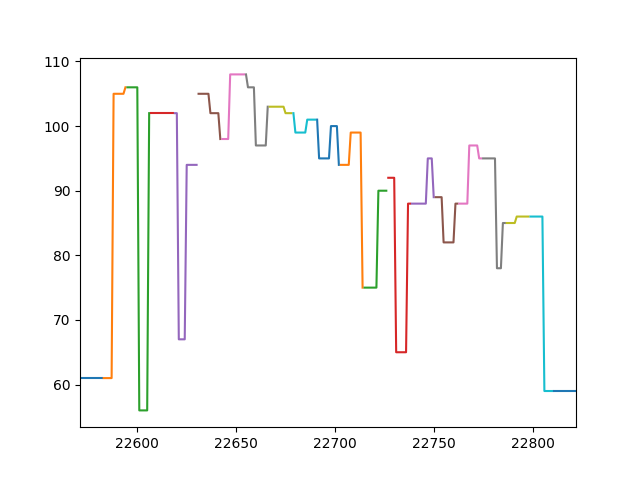

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
36


<IPython.core.display.Javascript object>


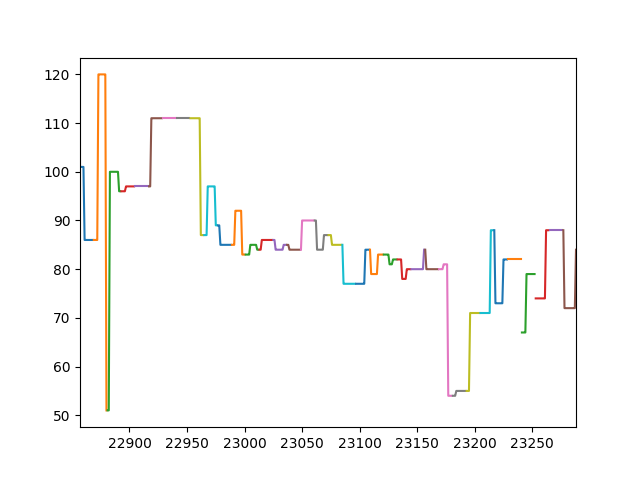

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
11


<IPython.core.display.Javascript object>


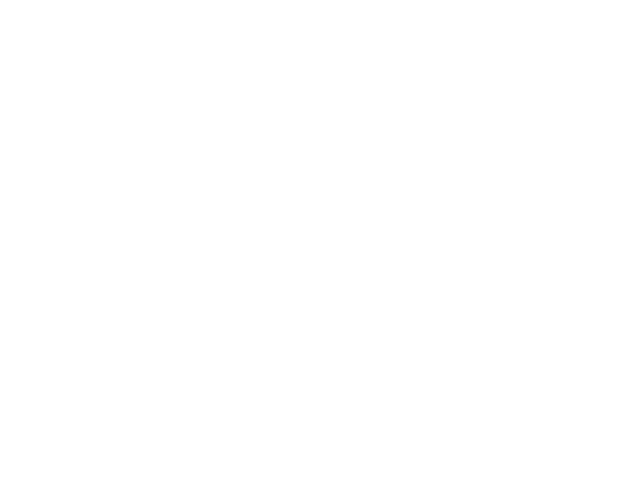

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
6


<IPython.core.display.Javascript object>


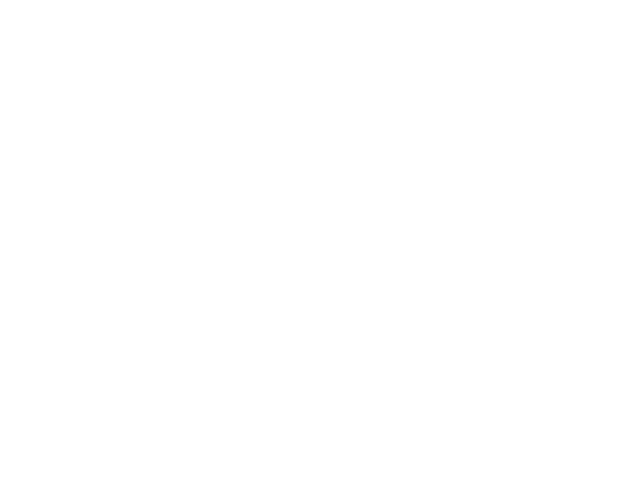

0 12
12 24
24 36
36 48
48 60
60 72
7


<IPython.core.display.Javascript object>


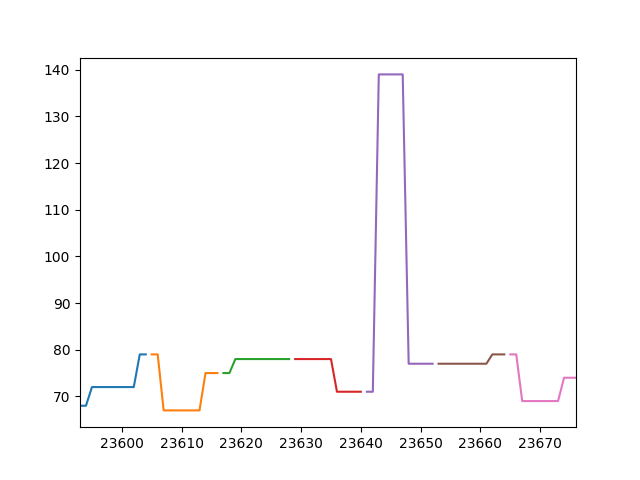

0 12
12 24
24 36
36 48
48 60
60 72
72 84
8


<IPython.core.display.Javascript object>


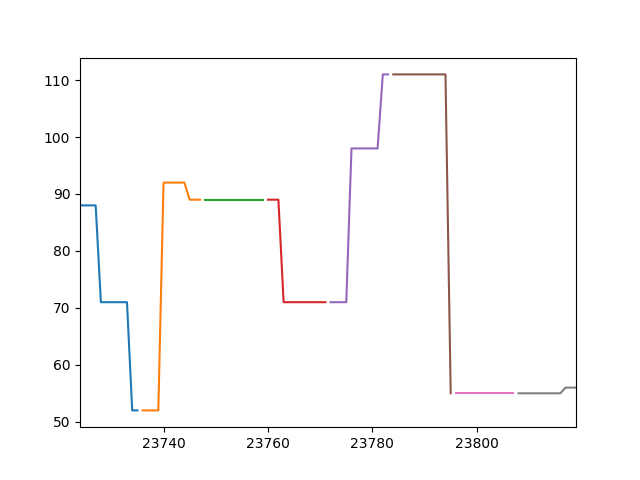

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
0


<IPython.core.display.Javascript object>


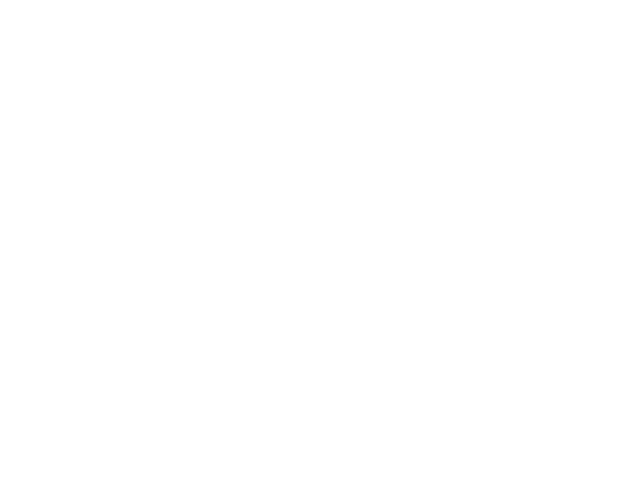

18


<IPython.core.display.Javascript object>


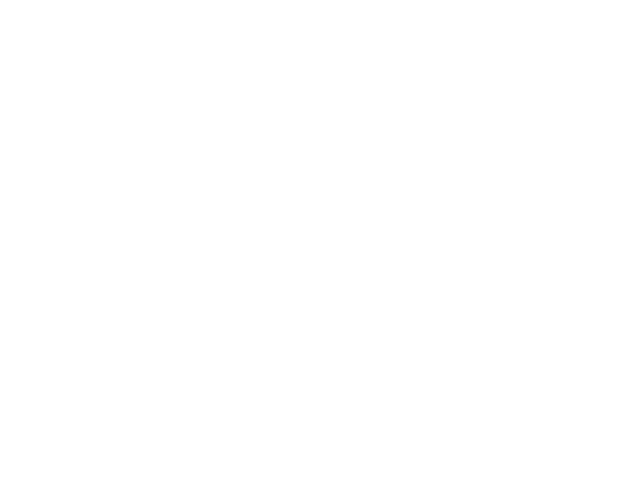

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
583


<IPython.core.display.Javascript object>


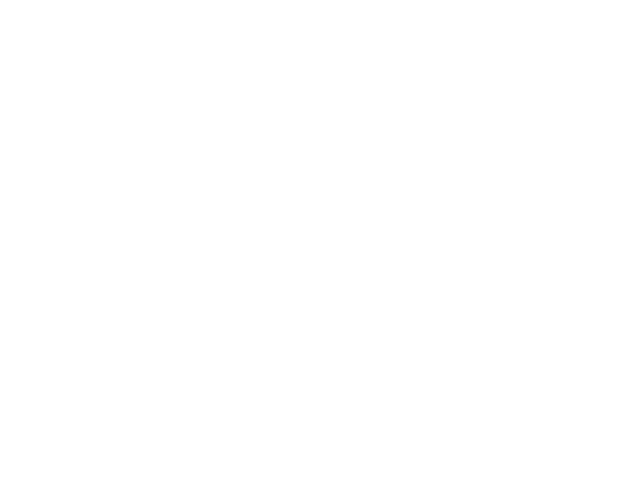

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
732 744
744 756
756 768
768 780
780 792
792 804
804 816
816 828
828 840
840 852
852 864
864 876
876 888
888 900
900 912
912 924
924 936
936 948
948 960
960 972
972 984
984 996
996 1008
1008 1020
1020 1032
1032 1044
1044 1056
1056 1068
1068 1080
1080 1092
1092 1104
1104 1116
1116 1128
1128 1140
1140 1152
1152 1164
1164 1176
1176 1188
1188 1200
1200 1212
1212 1224
1224 1236
1236 1248
1248 1260
1260 1272
1272 1284
1284 1296
1296 1308
1308 1320
1320 1332
1332 1344
1344 1356
1356 1368
1368 1380
1380 1392
1392 1404
1404 1416
1416 

<IPython.core.display.Javascript object>


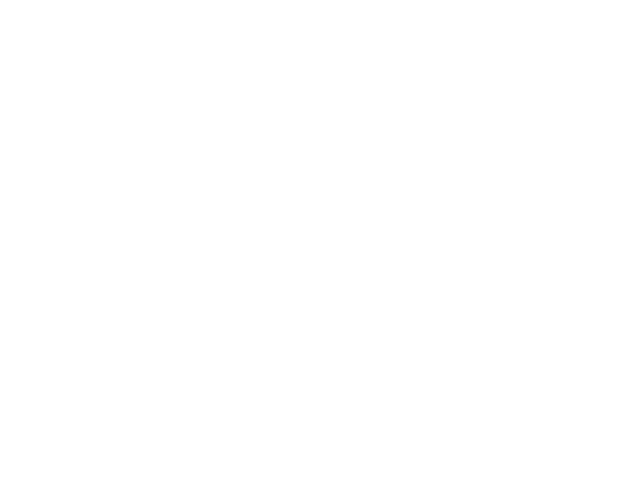

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
2


<IPython.core.display.Javascript object>


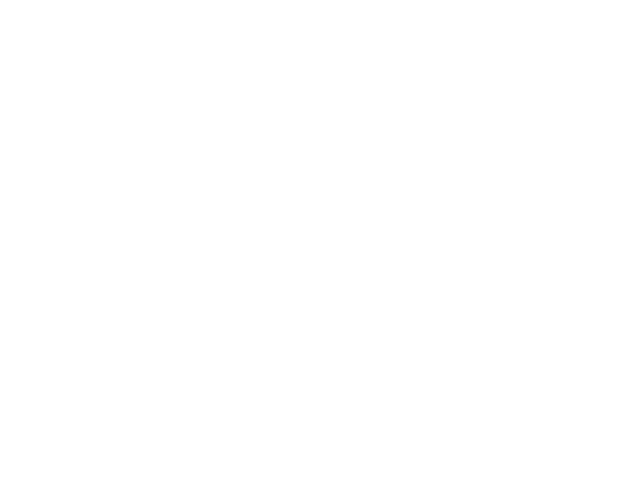

0 12
12 24
18


<IPython.core.display.Javascript object>


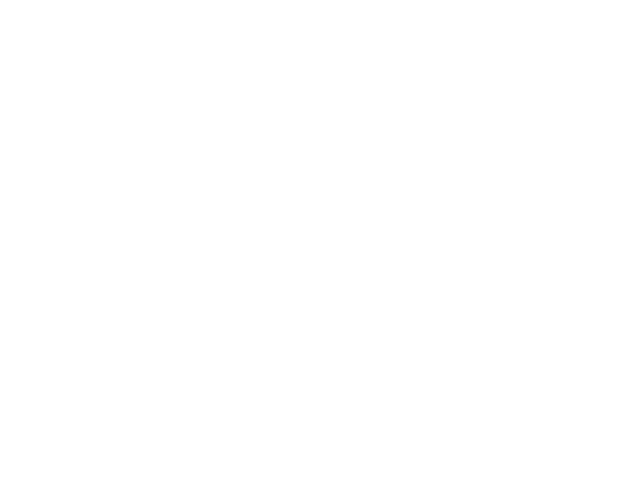

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
13


<IPython.core.display.Javascript object>


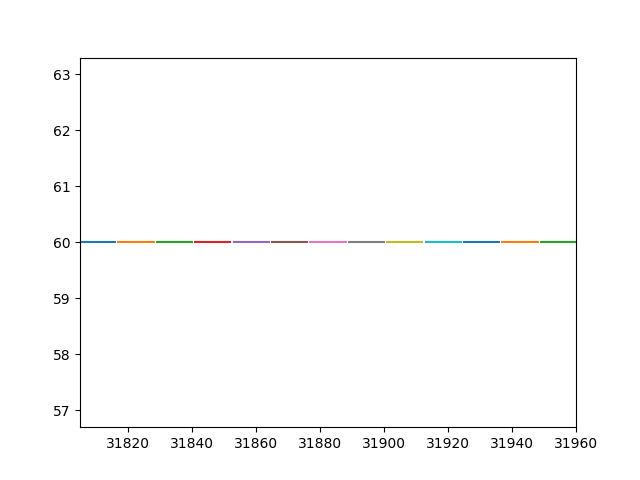

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
5


<IPython.core.display.Javascript object>


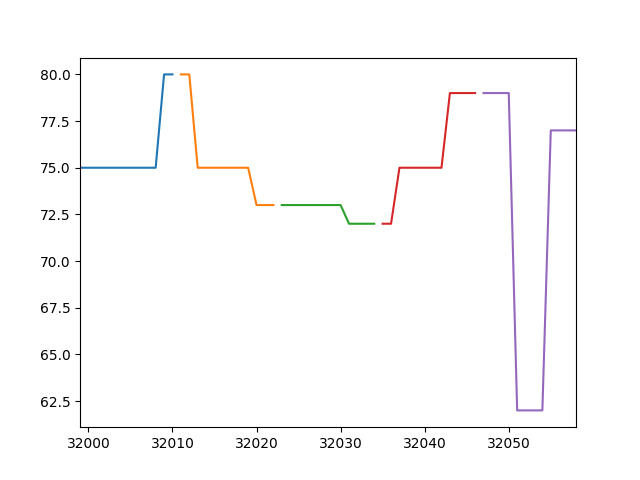

0 12
12 24
24 36
36 48
48 60
0


<IPython.core.display.Javascript object>


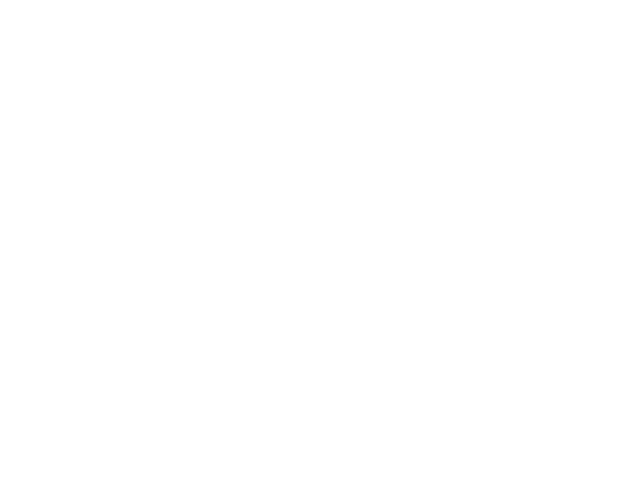

0


<IPython.core.display.Javascript object>


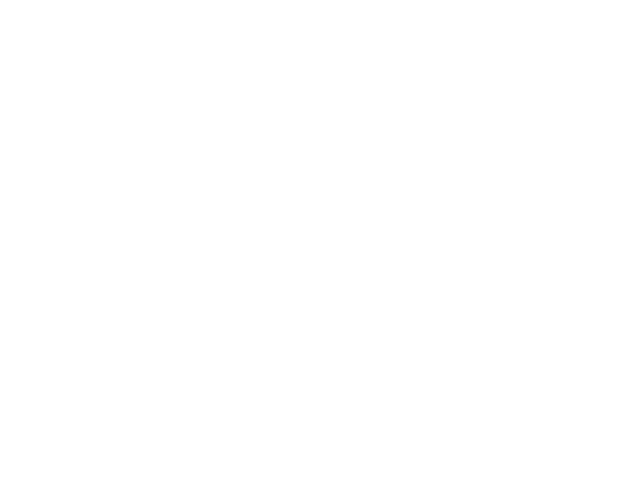

7


<IPython.core.display.Javascript object>


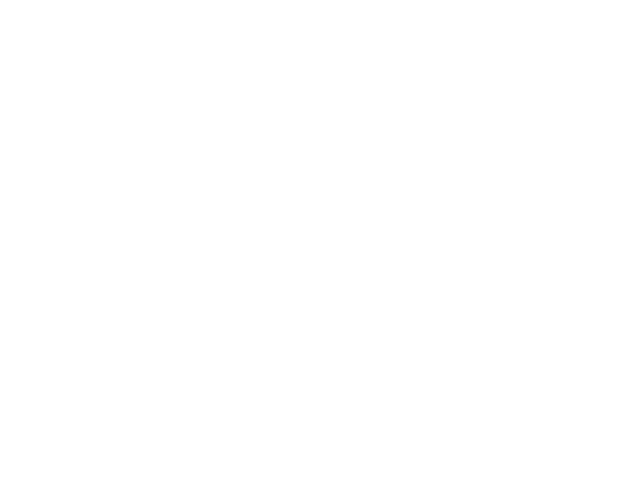

0 12
12 24
24 36
36 48
48 60
60 72
72 84
26


<IPython.core.display.Javascript object>


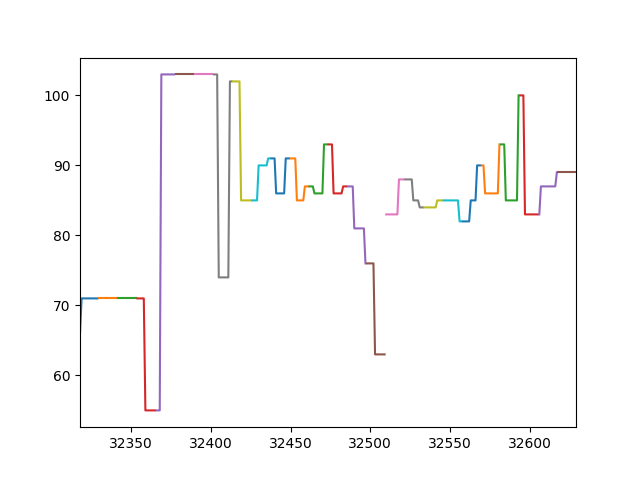

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
4


<IPython.core.display.Javascript object>


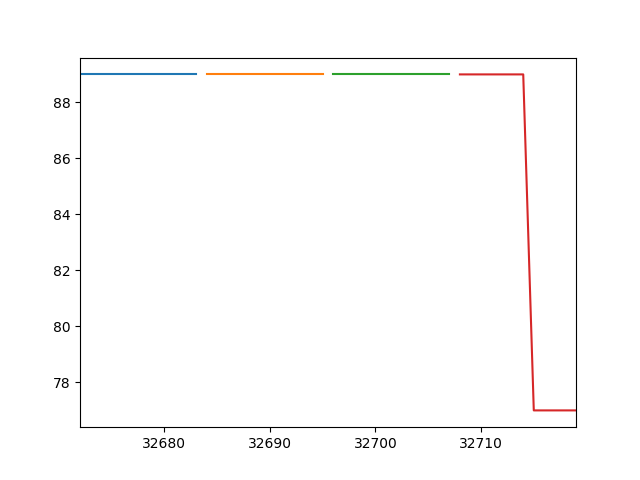

0 12
12 24
24 36
36 48
38


<IPython.core.display.Javascript object>


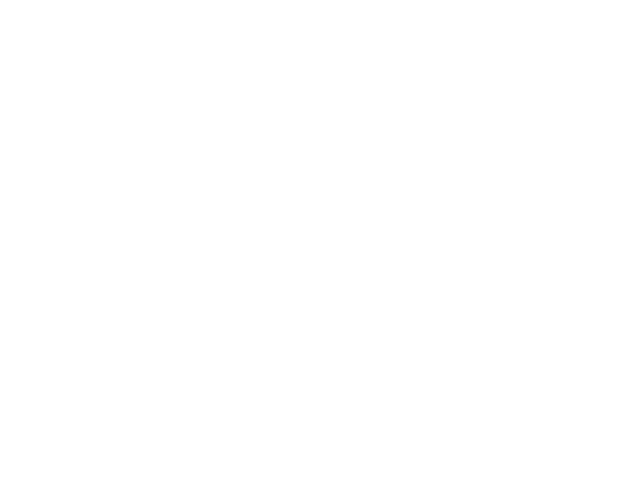

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
15


<IPython.core.display.Javascript object>


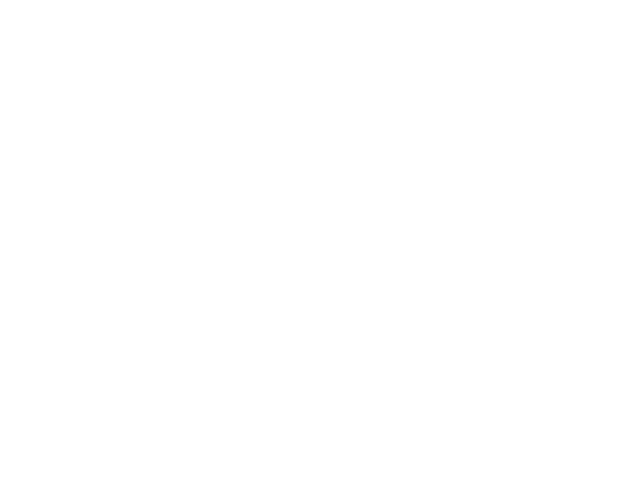

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
276


<IPython.core.display.Javascript object>


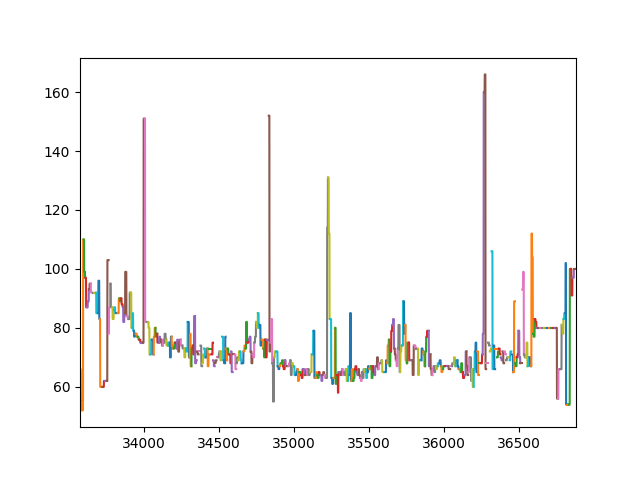

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
732 744
744 756
756 768
768 780
780 792
792 804
804 816
816 828
828 840
840 852
852 864
864 876
876 888
888 900
900 912
912 924
924 936
936 948
948 960
960 972
972 984
984 996
996 1008
1008 1020
1020 1032
1032 1044
1044 1056
1056 1068
1068 1080
1080 1092
1092 1104
1104 1116
1116 1128
1128 1140
1140 1152
1152 1164
1164 1176
1176 1188
1188 1200
1200 1212
1212 1224
1224 1236
1236 1248
1248 1260
1260 1272
1272 1284
1284 1296
1296 1308
1308 1320
1320 1332
1332 1344
1344 1356
1356 1368
1368 1380
1380 1392
1392 1404
1404 1416
1416 

<IPython.core.display.Javascript object>


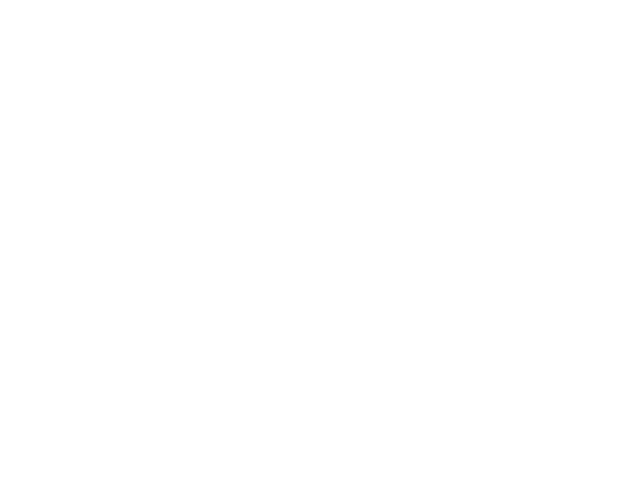

21


<IPython.core.display.Javascript object>


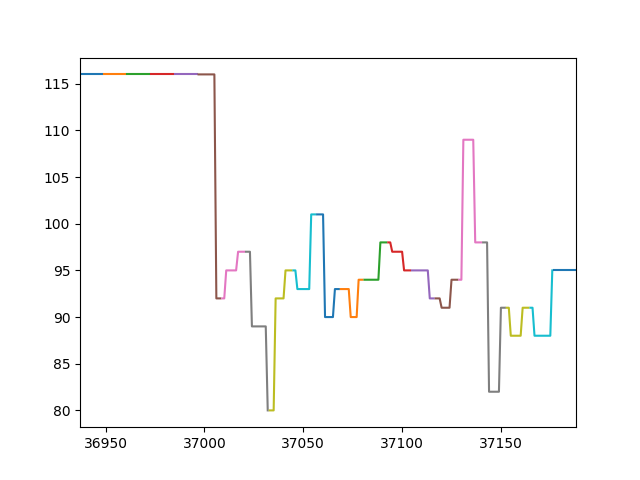

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
45


<IPython.core.display.Javascript object>


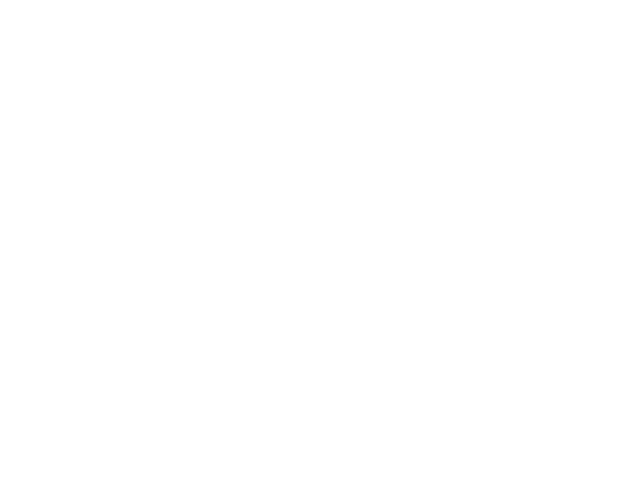

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
13


<IPython.core.display.Javascript object>


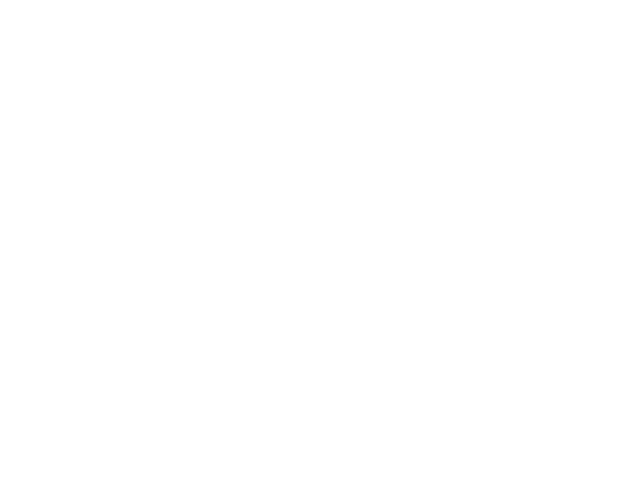

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
6


<IPython.core.display.Javascript object>


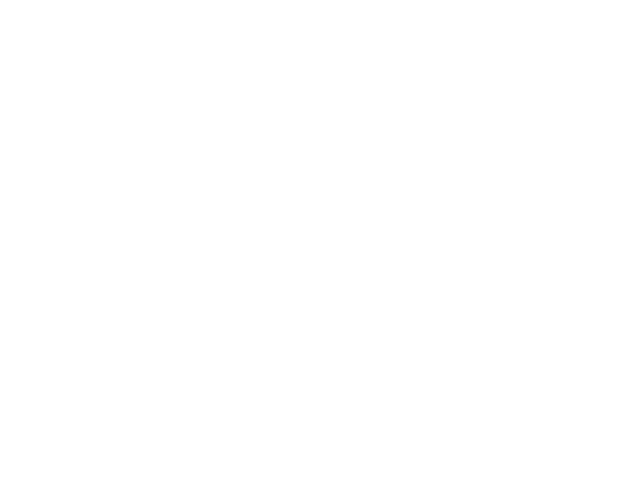

0 12
12 24
24 36
36 48
48 60
60 72
7


<IPython.core.display.Javascript object>


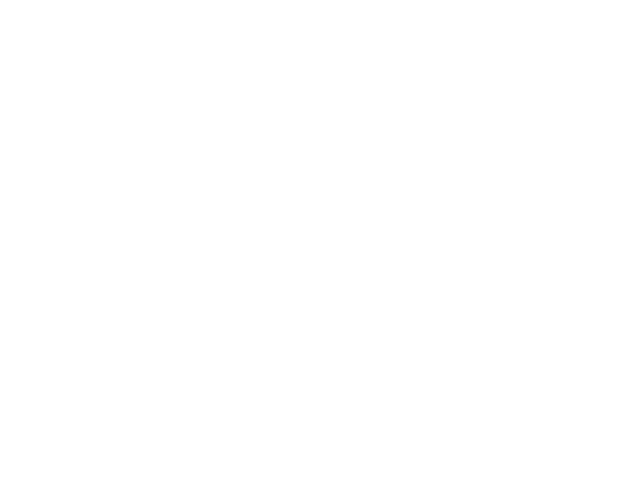

0 12
12 24
24 36
36 48
48 60
60 72
72 84
0


<IPython.core.display.Javascript object>


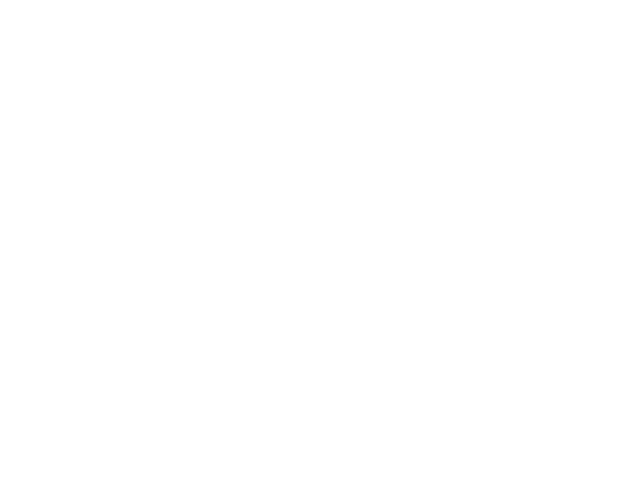

21


<IPython.core.display.Javascript object>


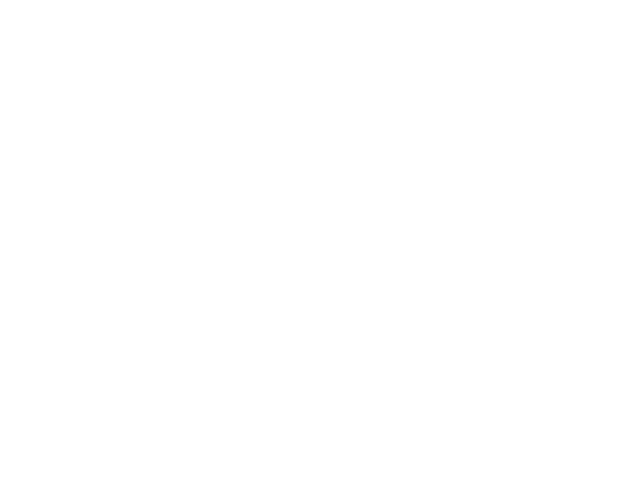

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
11


<IPython.core.display.Javascript object>


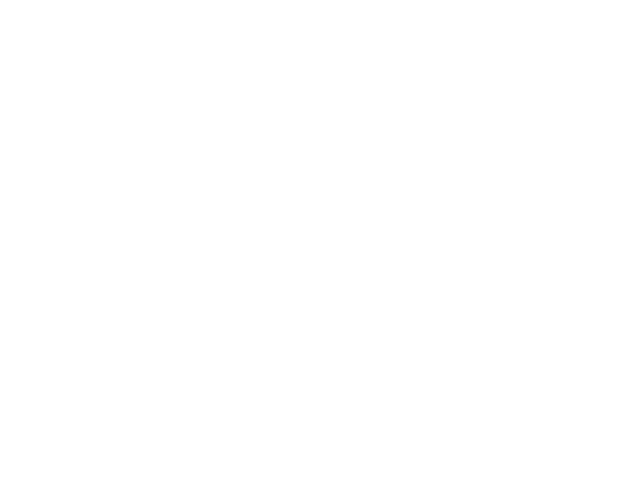

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
8


<IPython.core.display.Javascript object>


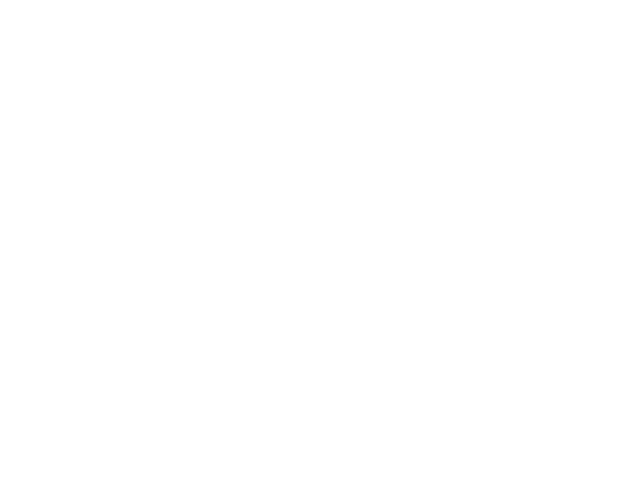

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
5


<IPython.core.display.Javascript object>


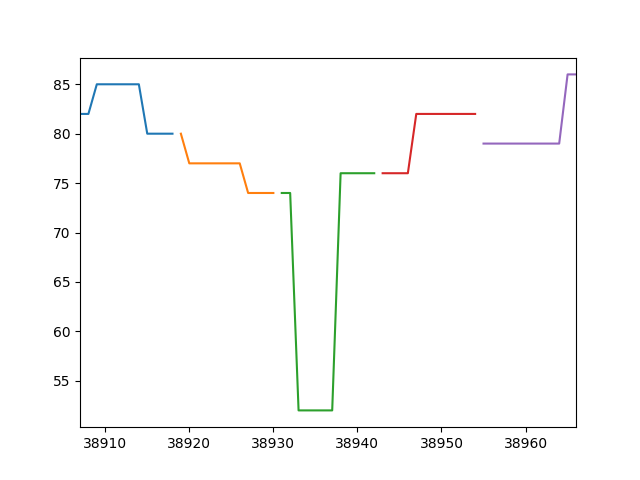

0 12
12 24
24 36
36 48
48 60
12


<IPython.core.display.Javascript object>


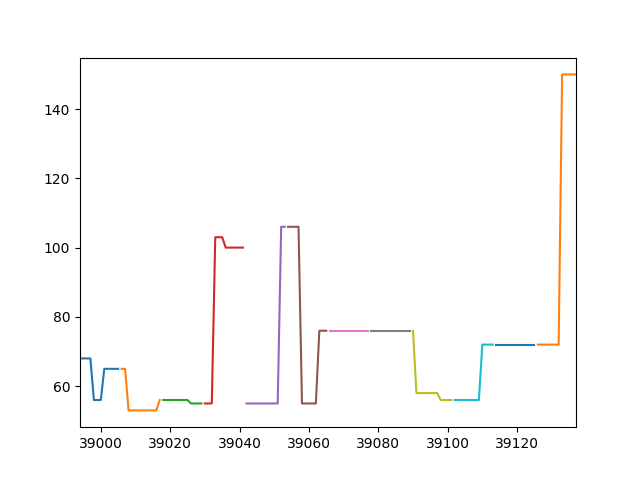

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
36


<IPython.core.display.Javascript object>


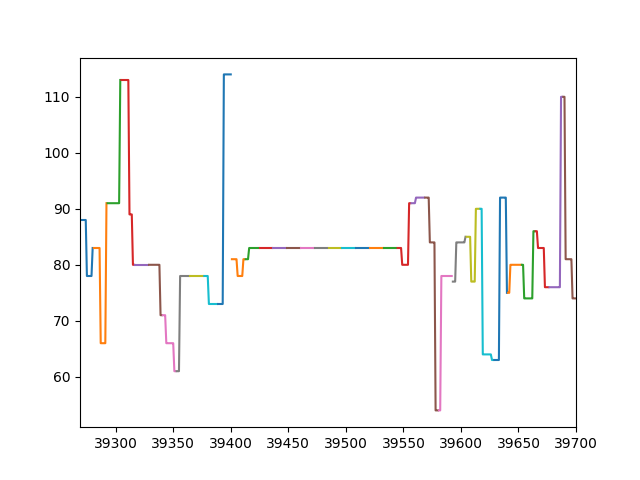

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
3


<IPython.core.display.Javascript object>


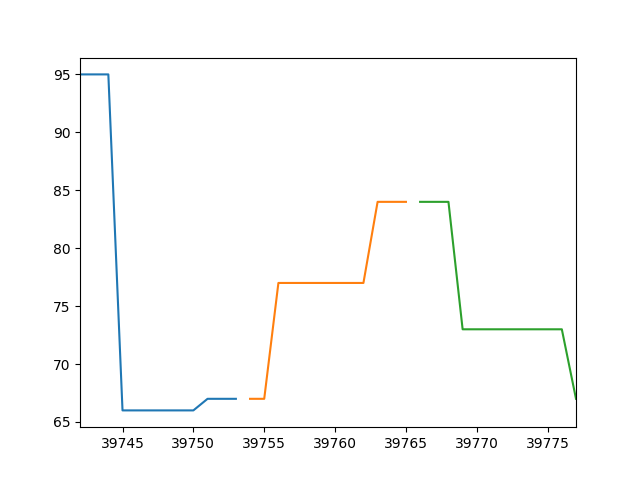

0 12
12 24
24 36
0


<IPython.core.display.Javascript object>


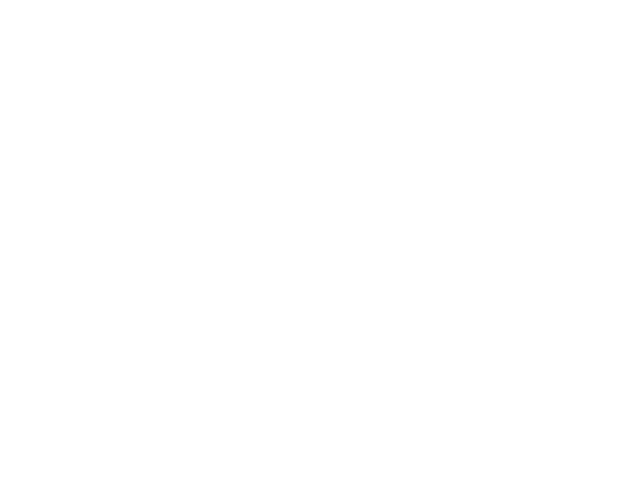

8


<IPython.core.display.Javascript object>


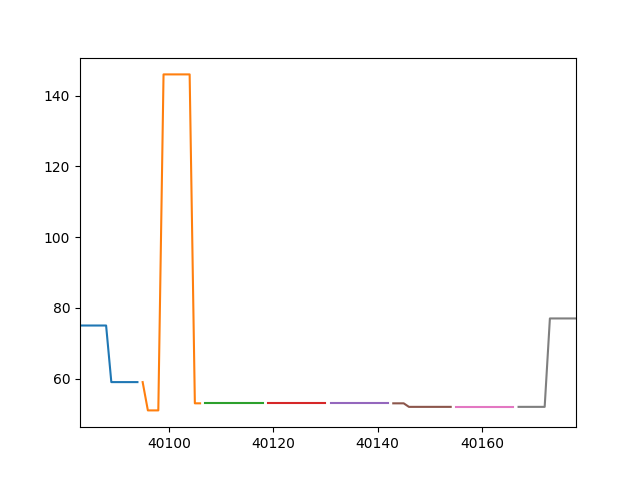

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
38


<IPython.core.display.Javascript object>


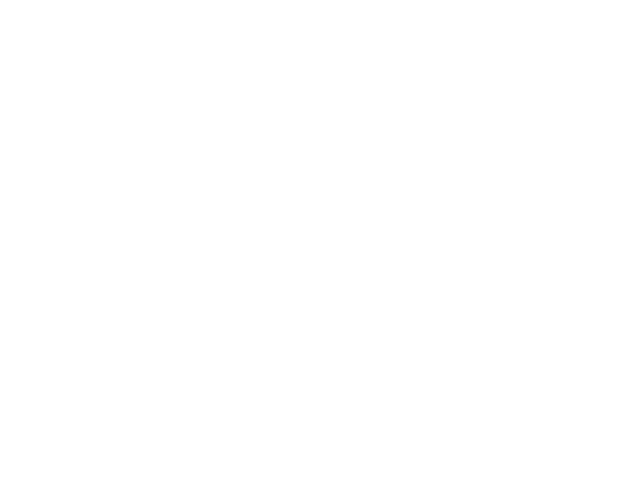

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
10


<IPython.core.display.Javascript object>


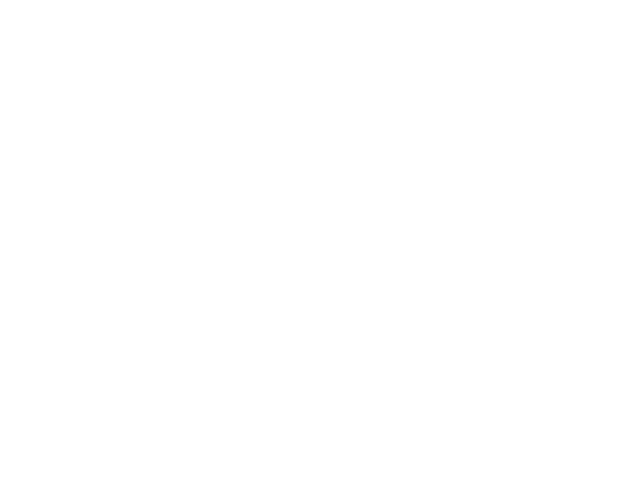

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
49


<IPython.core.display.Javascript object>


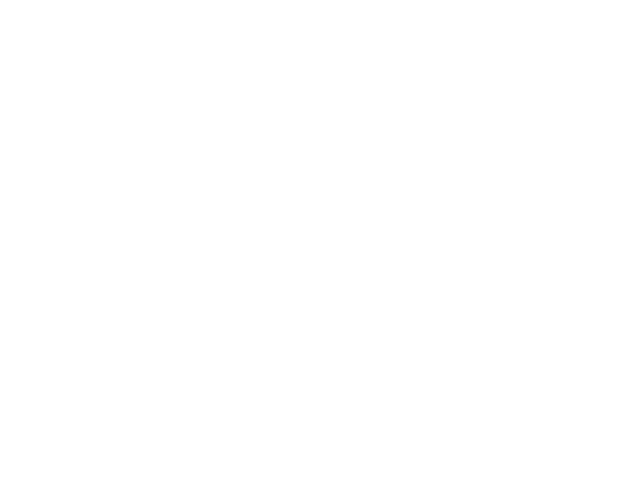

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
9


<IPython.core.display.Javascript object>


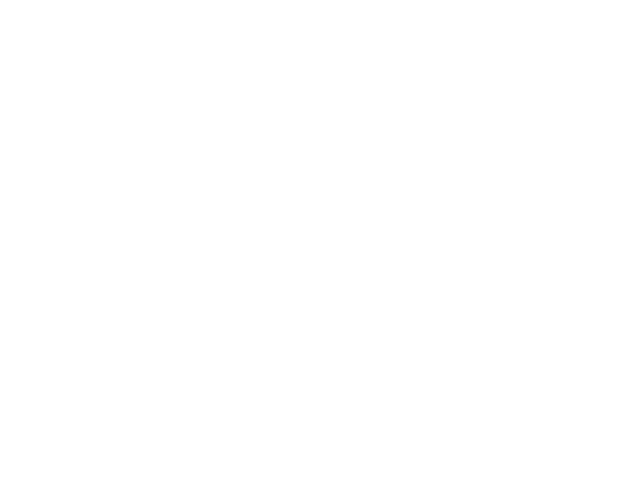

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
43


<IPython.core.display.Javascript object>


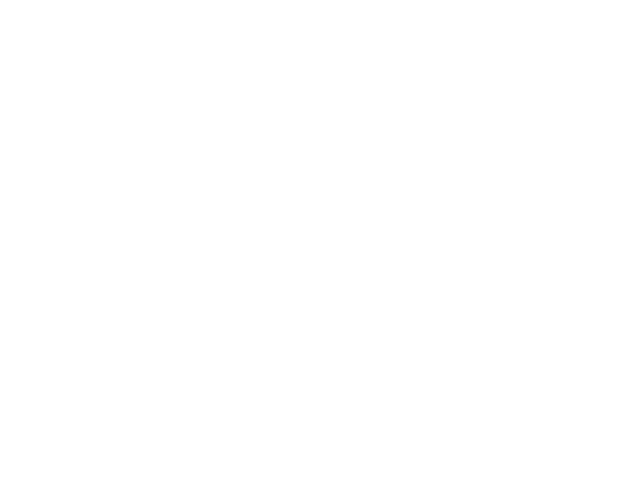

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
32


<IPython.core.display.Javascript object>


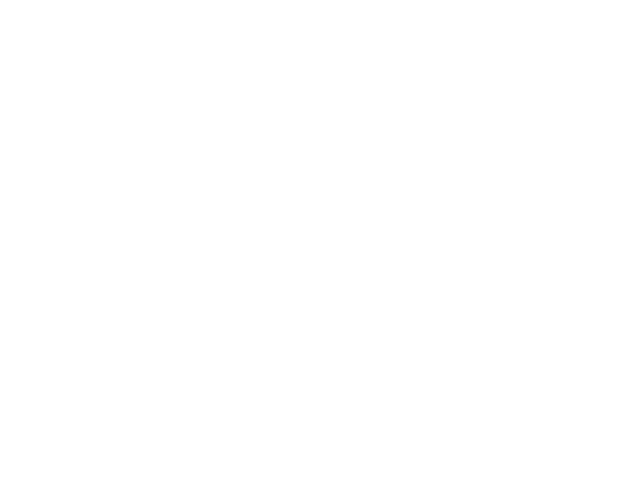

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
5


<IPython.core.display.Javascript object>


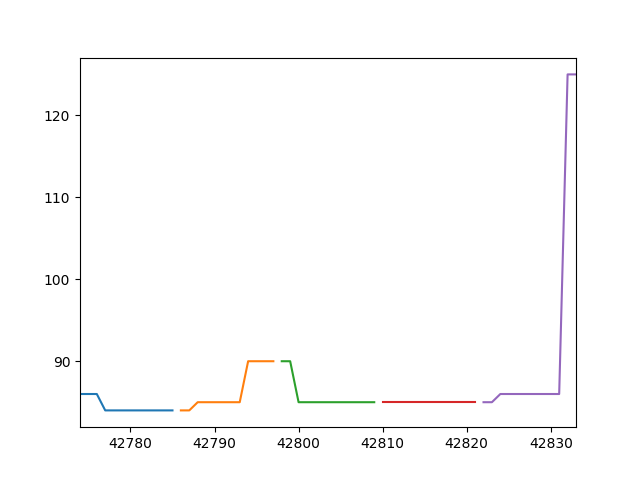

0 12
12 24
24 36
36 48
48 60
14


<IPython.core.display.Javascript object>


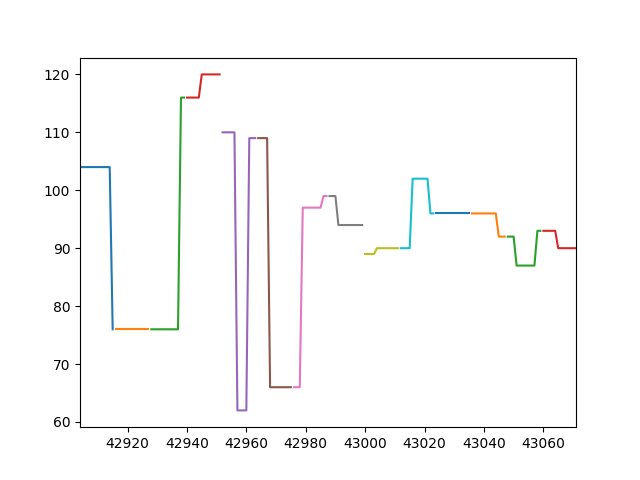

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
4


<IPython.core.display.Javascript object>


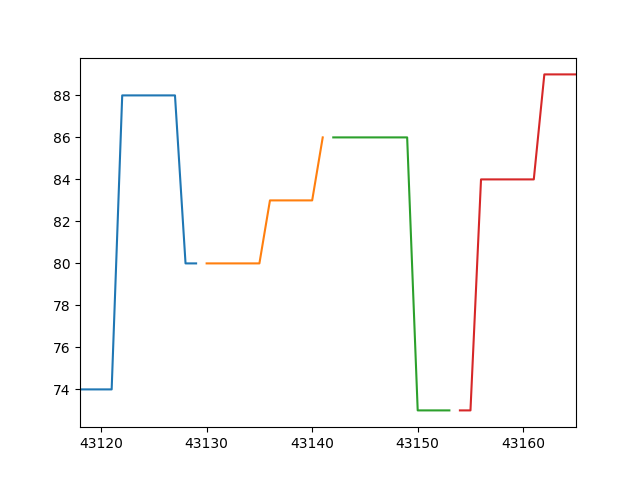

0 12
12 24
24 36
36 48
7


<IPython.core.display.Javascript object>


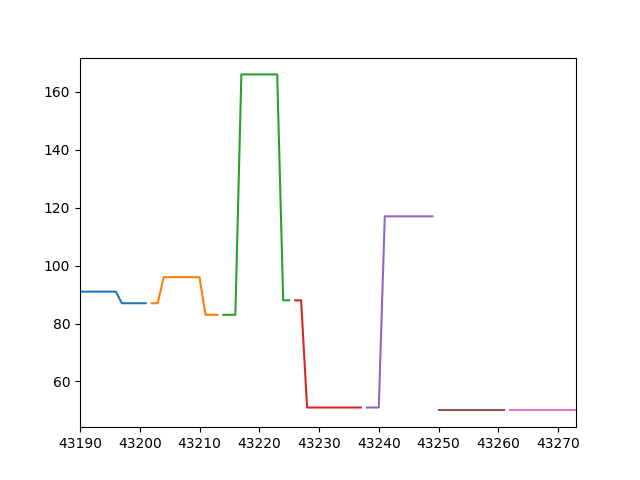

0 12
12 24
24 36
36 48
48 60
60 72
72 84
1


<IPython.core.display.Javascript object>


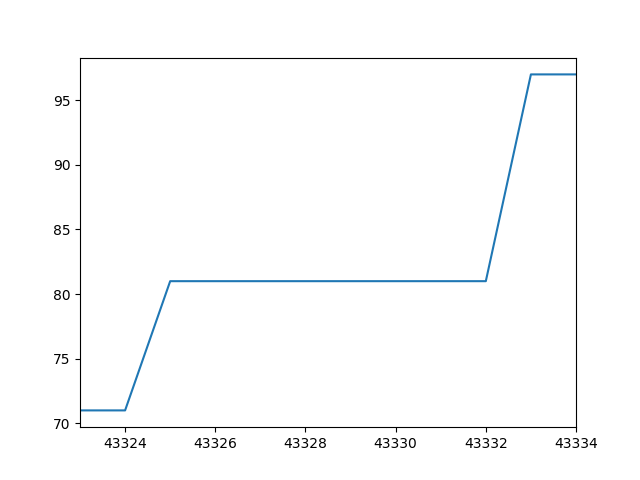

0 12
83


<IPython.core.display.Javascript object>


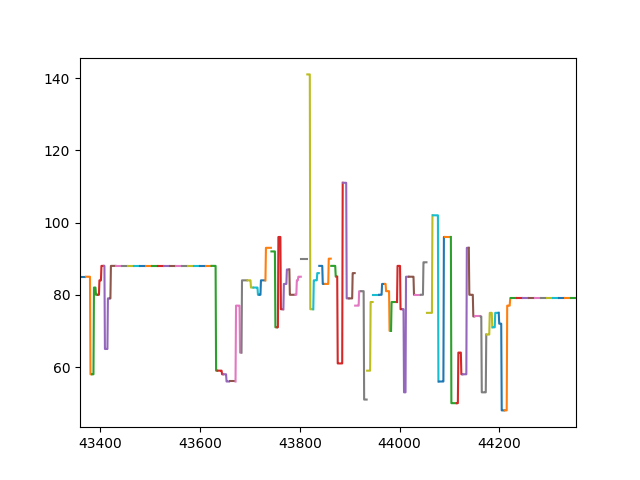

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
732 744
744 756
756 768
768 780
780 792
792 804
804 816
816 828
828 840
840 852
852 864
864 876
876 888
888 900
900 912
912 924
924 936
936 948
948 960
960 972
972 984
984 996
0


<IPython.core.display.Javascript object>


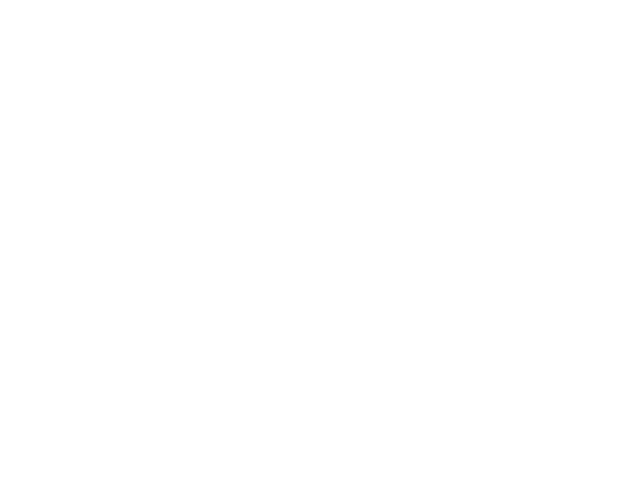

24


<IPython.core.display.Javascript object>


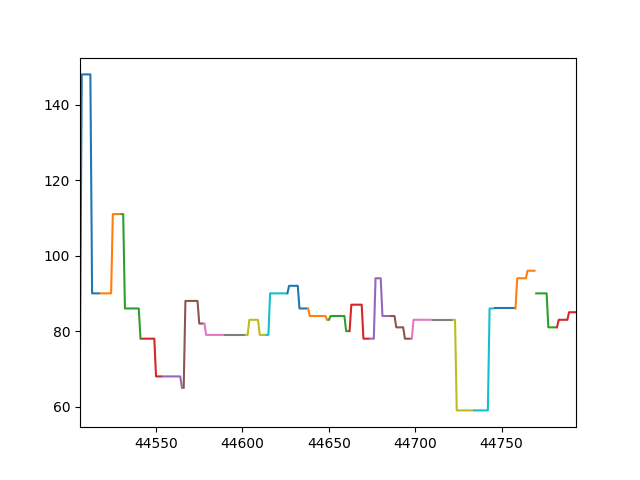

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
18


<IPython.core.display.Javascript object>


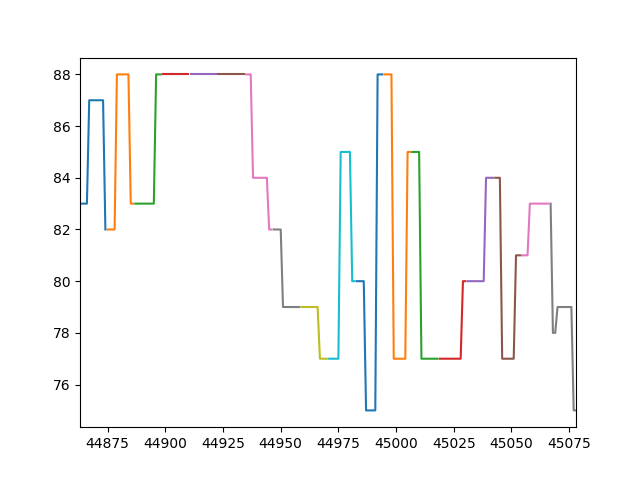

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
5


<IPython.core.display.Javascript object>


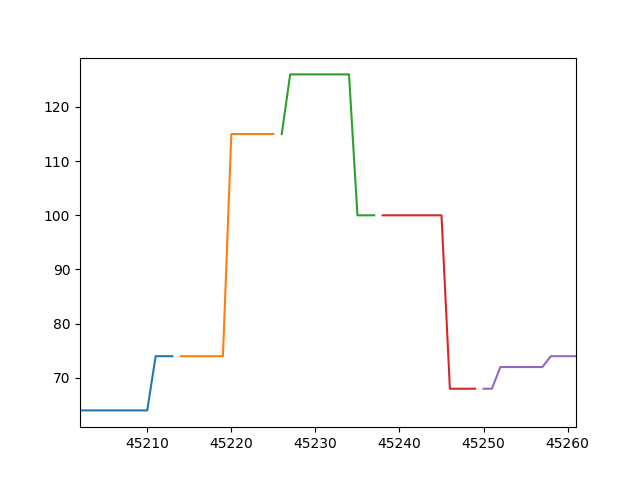

0 12
12 24
24 36
36 48
48 60
157


<IPython.core.display.Javascript object>


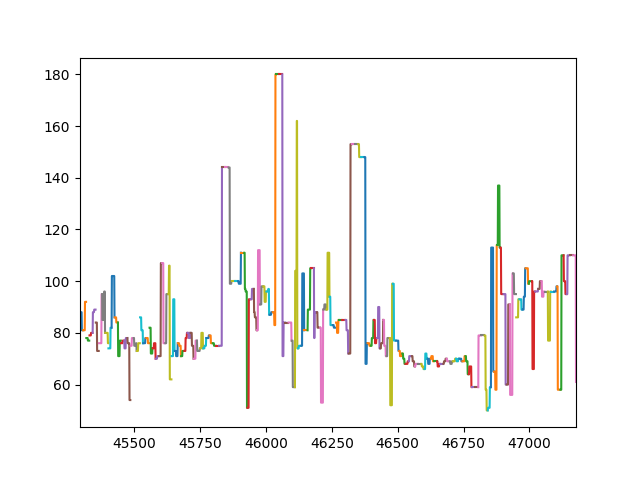

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
732 744
744 756
756 768
768 780
780 792
792 804
804 816
816 828
828 840
840 852
852 864
864 876
876 888
888 900
900 912
912 924
924 936
936 948
948 960
960 972
972 984
984 996
996 1008
1008 1020
1020 1032
1032 1044
1044 1056
1056 1068
1068 1080
1080 1092
1092 1104
1104 1116
1116 1128
1128 1140
1140 1152
1152 1164
1164 1176
1176 1188
1188 1200
1200 1212
1212 1224
1224 1236
1236 1248
1248 1260
1260 1272
1272 1284
1284 1296
1296 1308
1308 1320
1320 1332
1332 1344
1344 1356
1356 1368
1368 1380
1380 1392
1392 1404
1404 1416
1416 

<IPython.core.display.Javascript object>


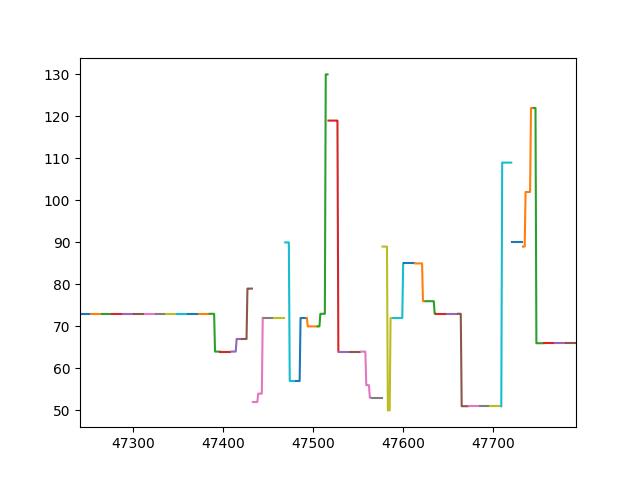

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
9


<IPython.core.display.Javascript object>


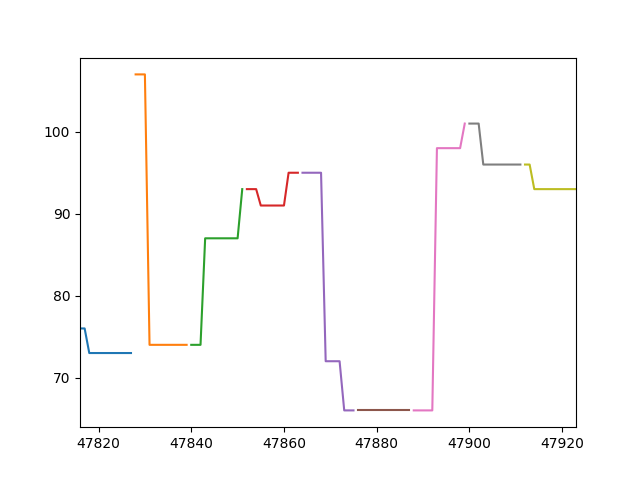

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
4


<IPython.core.display.Javascript object>


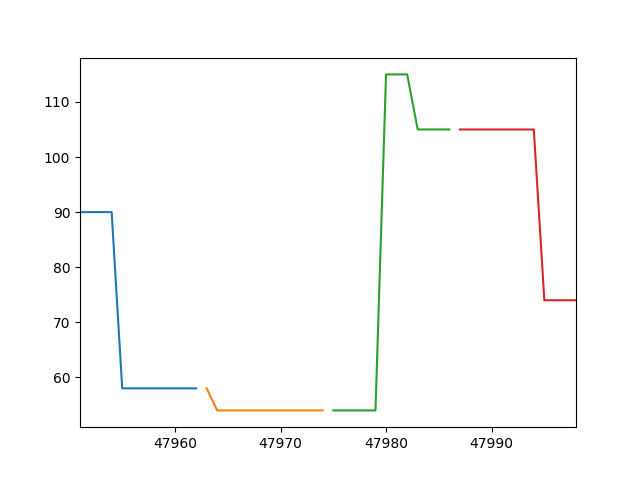

0 12
12 24
24 36
36 48
14


<IPython.core.display.Javascript object>


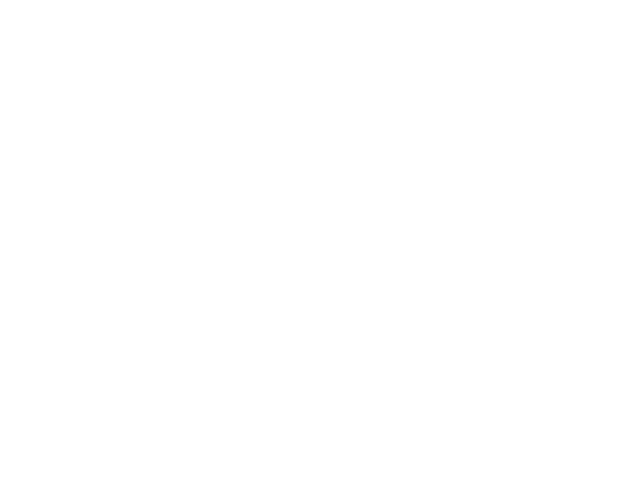

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
273


<IPython.core.display.Javascript object>


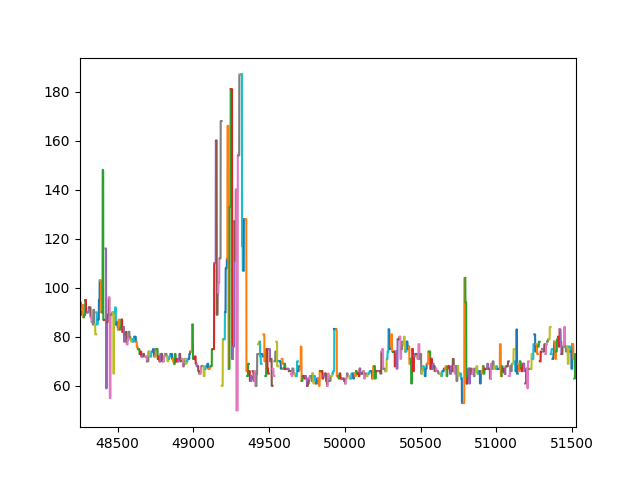

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
732 744
744 756
756 768
768 780
780 792
792 804
804 816
816 828
828 840
840 852
852 864
864 876
876 888
888 900
900 912
912 924
924 936
936 948
948 960
960 972
972 984
984 996
996 1008
1008 1020
1020 1032
1032 1044
1044 1056
1056 1068
1068 1080
1080 1092
1092 1104
1104 1116
1116 1128
1128 1140
1140 1152
1152 1164
1164 1176
1176 1188
1188 1200
1200 1212
1212 1224
1224 1236
1236 1248
1248 1260
1260 1272
1272 1284
1284 1296
1296 1308
1308 1320
1320 1332
1332 1344
1344 1356
1356 1368
1368 1380
1380 1392
1392 1404
1404 1416
1416 

<IPython.core.display.Javascript object>


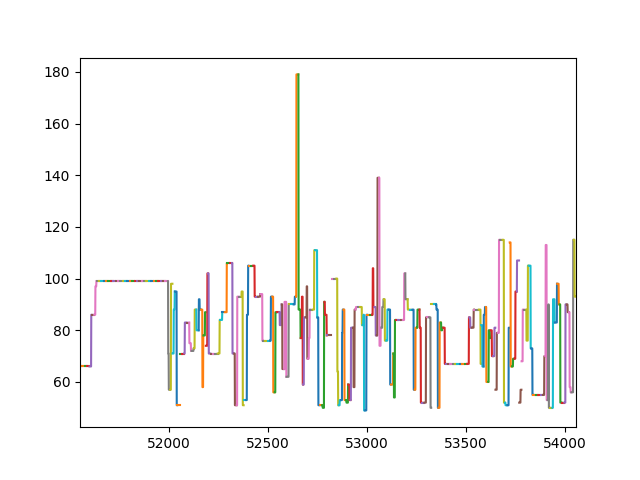

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
732 744
744 756
756 768
768 780
780 792
792 804
804 816
816 828
828 840
840 852
852 864
864 876
876 888
888 900
900 912
912 924
924 936
936 948
948 960
960 972
972 984
984 996
996 1008
1008 1020
1020 1032
1032 1044
1044 1056
1056 1068
1068 1080
1080 1092
1092 1104
1104 1116
1116 1128
1128 1140
1140 1152
1152 1164
1164 1176
1176 1188
1188 1200
1200 1212
1212 1224
1224 1236
1236 1248
1248 1260
1260 1272
1272 1284
1284 1296
1296 1308
1308 1320
1320 1332
1332 1344
1344 1356
1356 1368
1368 1380
1380 1392
1392 1404
1404 1416
1416 

<IPython.core.display.Javascript object>


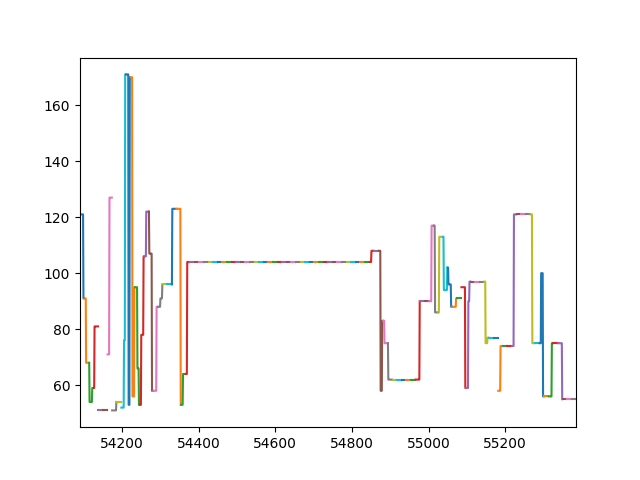

0 12
12 24
24 36
36 48
48 60
60 72
72 84
84 96
96 108
108 120
120 132
132 144
144 156
156 168
168 180
180 192
192 204
204 216
216 228
228 240
240 252
252 264
264 276
276 288
288 300
300 312
312 324
324 336
336 348
348 360
360 372
372 384
384 396
396 408
408 420
420 432
432 444
444 456
456 468
468 480
480 492
492 504
504 516
516 528
528 540
540 552
552 564
564 576
576 588
588 600
600 612
612 624
624 636
636 648
648 660
660 672
672 684
684 696
696 708
708 720
720 732
732 744
744 756
756 768
768 780
780 792
792 804
804 816
816 828
828 840
840 852
852 864
864 876
876 888
888 900
900 912
912 924
924 936
936 948
948 960
960 972
972 984
984 996
996 1008
1008 1020
1020 1032
1032 1044
1044 1056
1056 1068
1068 1080
1080 1092
1092 1104
1104 1116
1116 1128
1128 1140
1140 1152
1152 1164
1164 1176
1176 1188
1188 1200
1200 1212
1212 1224
1224 1236
1236 1248
1248 1260
1260 1272
1272 1284
1284 1296


In [26]:

for dfs in data_with_gap:
    count = int(dfs['hr_value'].count().astype(int)/12)
    print(count)
    fig = plt.figure()
    for i in range(count):
        print(i*12,i*12+12)
        dfs['hr_value'][i*12:i*12+12].plot()
    plt.show()

In [22]:
for dfs in data_with_gap[0:2]:
    count = int(dfs['hr_value'].count().astype(int)/12)
    print(count)
    for i in range(count):
        print(i*12,i*12+12)
        print(dfs['hr_value'][i*12:i*12+12])
        print(dfs['hr_value'][i*12:i*12+12].rolling(2).std())

9
0 12
0     84.0
1     84.0
2     84.0
3     84.0
4     79.0
5     79.0
6     79.0
7     79.0
8     79.0
9     79.0
10    85.0
11    85.0
Name: hr_value, dtype: float64
0          NaN
1     0.000000
2     0.000000
3     0.000000
4     3.535534
5     0.000000
6     0.000000
7     0.000000
8     0.000000
9     0.000000
10    4.242641
11    0.000000
Name: hr_value, dtype: float64
12 24
12    85.0
13    85.0
14    85.0
15    85.0
16    85.0
17    85.0
18    85.0
19    85.0
20    85.0
21    92.0
22    92.0
23    92.0
Name: hr_value, dtype: float64
12         NaN
13    0.000000
14    0.000000
15    0.000000
16    0.000000
17    0.000000
18    0.000000
19    0.000000
20    0.000000
21    4.949747
22    0.000000
23    0.000000
Name: hr_value, dtype: float64
24 36
24    92.0
25    92.0
26    92.0
27    92.0
28    92.0
29    83.0
30    83.0
31    83.0
32    83.0
33    83.0
34    83.0
35    83.0
Name: hr_value, dtype: float64
24         NaN
25    0.000000
26    0.000000
27    0.000000
28    0.00

In [120]:
# df.hr_value = df.hr_value.astype(float)
# df.o2_value = df.o2_value.astype(float)
df_norm = pd.DataFrame()
df_norm['hr_value']=(df.hr_value-df.hr_value.min())/(df.hr_value.max()-df.hr_value.min())
df_norm['o2_value']=(df.o2_value-df.o2_value.min())/(df.o2_value.max()-df.o2_value.min())

# df_norm['hr_value']=(df.hr_value-df.hr_value.mean())/df.hr_value.std()
# df_norm['o2_value']=(df.o2_value-df.o2_value.mean())/df.o2_value.std()

<IPython.core.display.Javascript object>


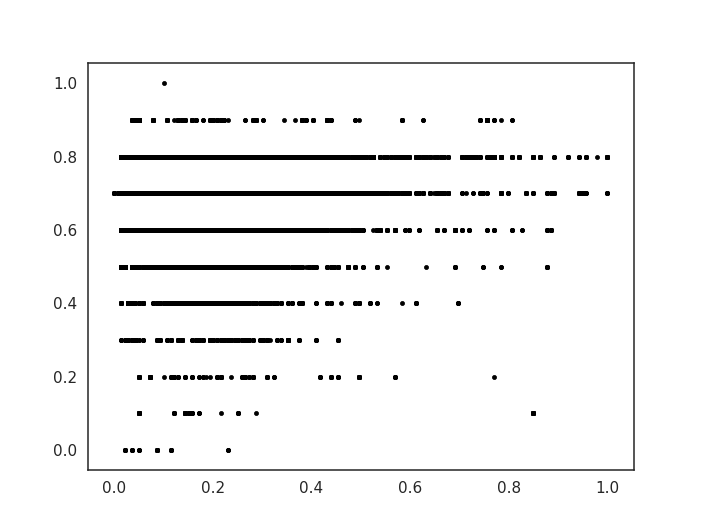

In [121]:
fig = plt.figure()
plt.scatter(df_norm.hr_value, df_norm.o2_value, c='black', s=7)
plt.show()

<IPython.core.display.Javascript object>


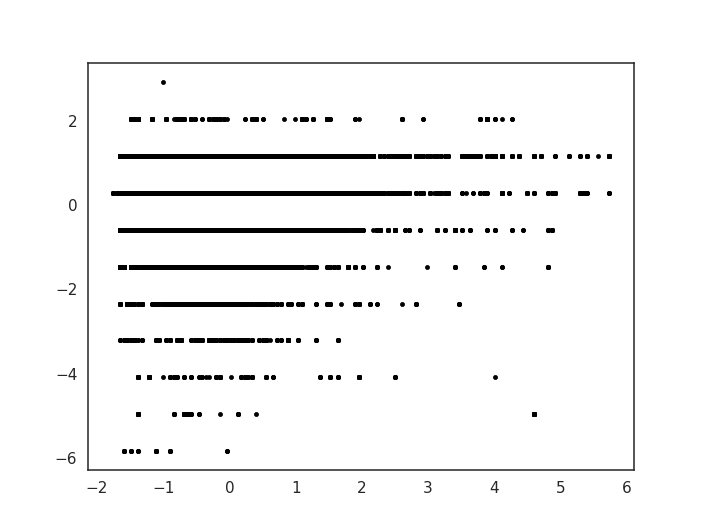

In [79]:
%matplotlib notebook
sns.set_style('white')
fig = plt.figure()
# plt.plot(df_norm.hr_value, df_norm.o2_value, 'ro', linewidth=0.5)
plt.scatter(df_norm.hr_value, df_norm.o2_value, c='black', s=7)
plt.show()

<IPython.core.display.Javascript object>


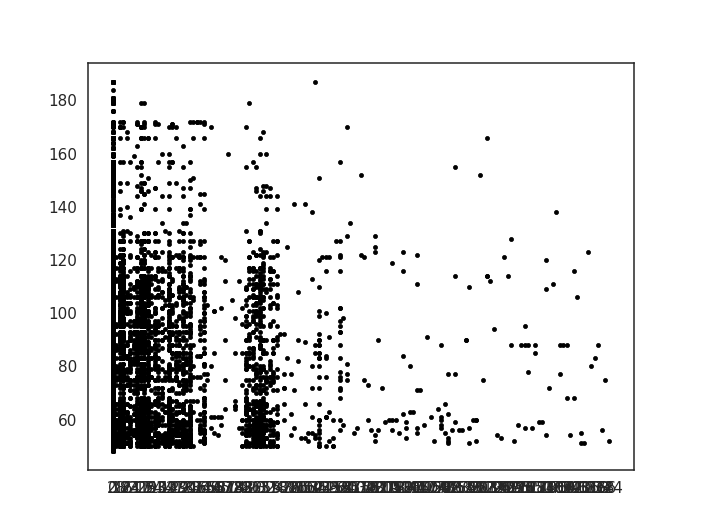

In [133]:
fig = plt.figure()
plt.scatter(df.step_value, df.hr_value, c='black', s=7)
plt.show()

In [152]:
X = np.array(list(zip(df.hr_value, df.step_value)))

In [150]:
df.step_value.mean()

1.4177561618992662

In [172]:
# Number of clusters
k = 2
# X coordinates of random centroids
C_x = np.random.randint(0, np.max(X)-30, size=k)
# Y coordinates of random centroids
C_y = np.random.randint(0, np.max(X)-30,size=k)
C = np.array(list(zip(C_x, C_y)), dtype=np.float32)
# C_x = [-2, 6]
# C_y = [4, -6]
# C = np.array(list(zip(C_x,C_y)))
print(C)

[[241.  31.]
 [ 34. 166.]]


<IPython.core.display.Javascript object>


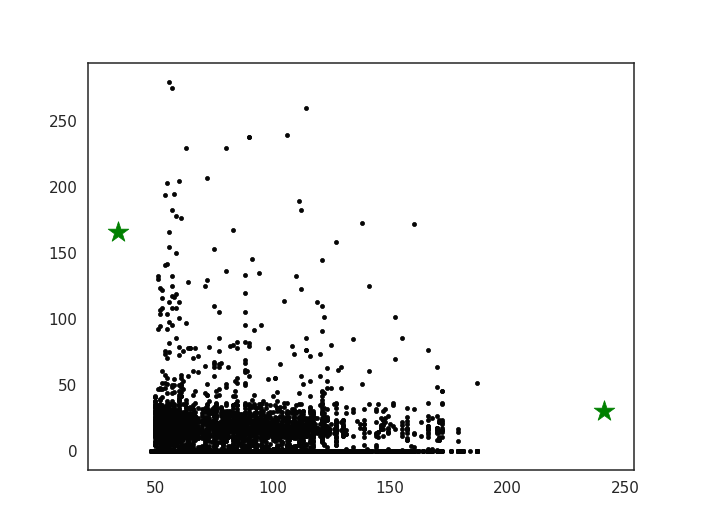

In [196]:
# Plotting along with the Centroids
fig = plt.figure()
plt.scatter(df.hr_value, df.step_value, c='#050505', s=7)
plt.scatter(C_x, C_y, marker='*', s=200, c='g')
plt.show()

In [47]:
# Euclidean Distance Caculator
def dist(a, b, ax=1):
    return np.linalg.norm(a - b, axis=ax)

In [174]:
# To store the value of centroids when it updates
C_old = np.zeros(C.shape)
# Cluster Lables(0, 1, 2)
clusters = np.zeros(len(X))
# Error func. - Distance between new centroids and old centroids
error = dist(C, C_old, None)
# Loop will run till the error becomes zero
while error != 0:
    # Assigning each value to its closest cluster    
    for i in range(len(X)):
        distances = dist(X[i], C)
        cluster = np.argmin(distances)
        clusters[i] = cluster
    # Storing the old centroid values
    C_old = deepcopy(C)
    # Finding the new centroids by taking the average value
    for i in range(k):
        points = [X[j] for j in range(len(X)) if clusters[j] == i]
        C[i] = np.mean(points, axis=0)
    error = dist(C, C_old, None)
    clear_output(wait=True)
    print(error)

0.0


<IPython.core.display.Javascript object>


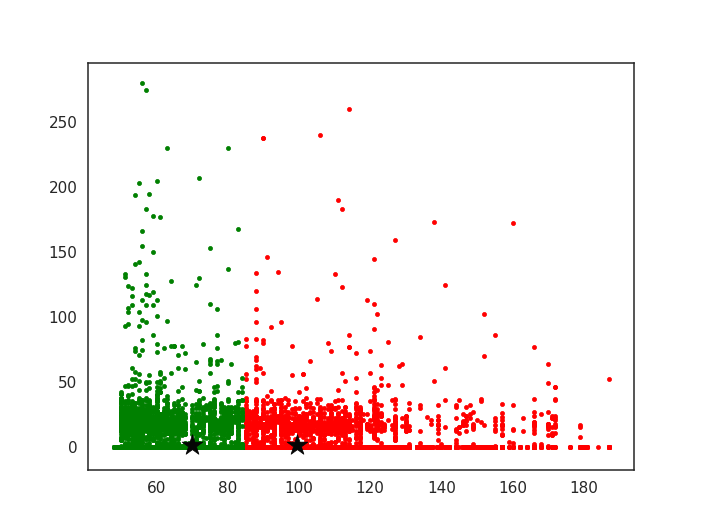

In [175]:
colors = ['r', 'g', 'b', 'y', 'c', 'm']
fig, ax = plt.subplots()
for i in range(k):
        points = np.array([X[j] for j in range(len(X)) if clusters[j] == i])
        ax.scatter(points[:, 0], points[:, 1], s=7, c=colors[i])
ax.scatter(C[:, 0], C[:, 1], marker='*', s=200, c='#050505')
plt.show()

In [178]:
C[:, 0], C[:, 1]

(array([99.29979, 69.90615], dtype=float32),
 array([1.5479977, 1.3425733], dtype=float32))

In [183]:
clusters[0:100]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [189]:
df['cluster'] = clusters

In [190]:
df.head()

,_id,day,hour,hr_value,latitude,longitude,minute,month,o2_value,second,step_value,timestamp,year,moving_distance,cluster
0,5c9b3935c4e5a668b7e9be2c,27,16,84.0,24.945194,121.372277,49,3,95.0,47,0.0,1.553677e+09,2019,NaN,1.0
1,5c9b393fc4e5a668b7e9be2e,27,16,84.0,24.945194,121.372277,49,3,95.0,57,0.0,1.553677e+09,2019,0.0,1.0
2,5c9b3949c4e5a668b7e9be30,27,16,84.0,24.945194,121.372277,50,3,95.0,7,0.0,1.553677e+09,2019,0.0,1.0
3,5c9b3953c4e5a668b7e9be32,27,16,84.0,24.945194,121.372277,50,3,95.0,17,0.0,1.553677e+09,2019,0.0,1.0
4,5c9b395dc4e5a668b7e9be34,27,16,79.0,24.945194,121.372277,50,3,98.0,27,0.0,1.553677e+09,2019,0.0,1.0


In [192]:
df['clusterDiff'] = df.cluster.diff()

<IPython.core.display.Javascript object>


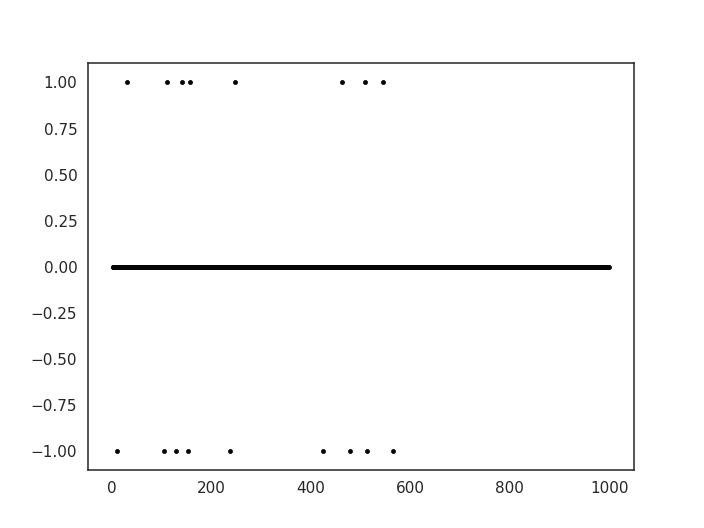

In [213]:
fig = plt.figure()
plt.scatter(range(len(df['clusterDiff'][0:1000])),df['clusterDiff'][0:1000], c='#050505', s=7)
plt.show()